<a href="https://colab.research.google.com/github/JoaoCioffi/Machine_Learning/blob/main/Supervised_Learning/Regressors/Regression_Systems.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Conceitos Introdutórios

- Regressão é um método estatístico que tenta determinar a força e o caráter da relação entre uma variável dependente (y) e uma série de outras variáveis independentes (X);
- Equação geral: `y=beta_0+beta_1*X_1+beta_2*X_2+...+beta_n*X_n`, em que:
  - X é a matriz dos regressores (ou features);
  - y é a matriz resposta (ou target);
  - beta é a matriz dos coeficientes lineares
- Modelos de regressão preveem uma variável contínua, como por exemplo o preço de um produto com as características dele;

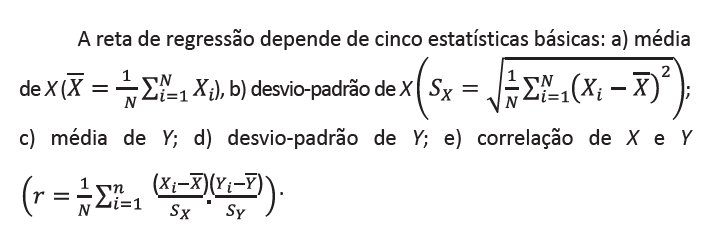

`Referência: Chein, F.; Introdução aos Modelos de Regressão Linear; Enap, 2019.`

---
Métricas de Avaliação de um Modelo:

1. Mean Absolute Error

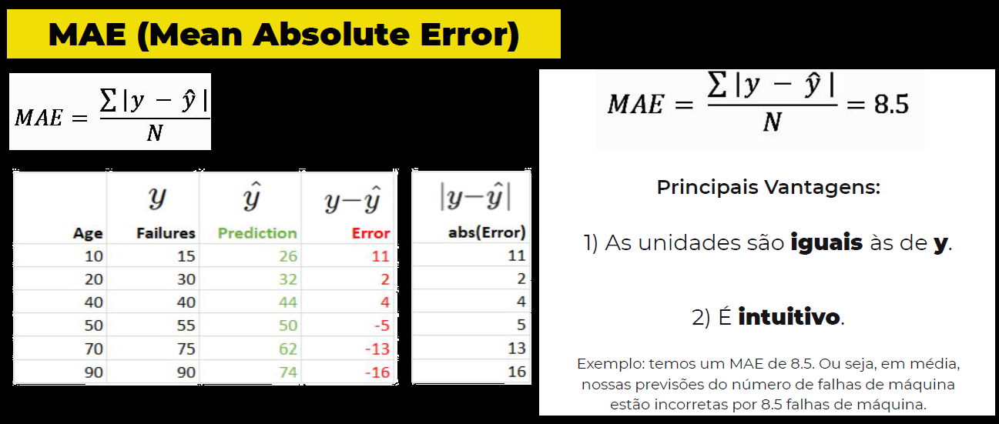

2. Root Mean Square Error (RMSE)

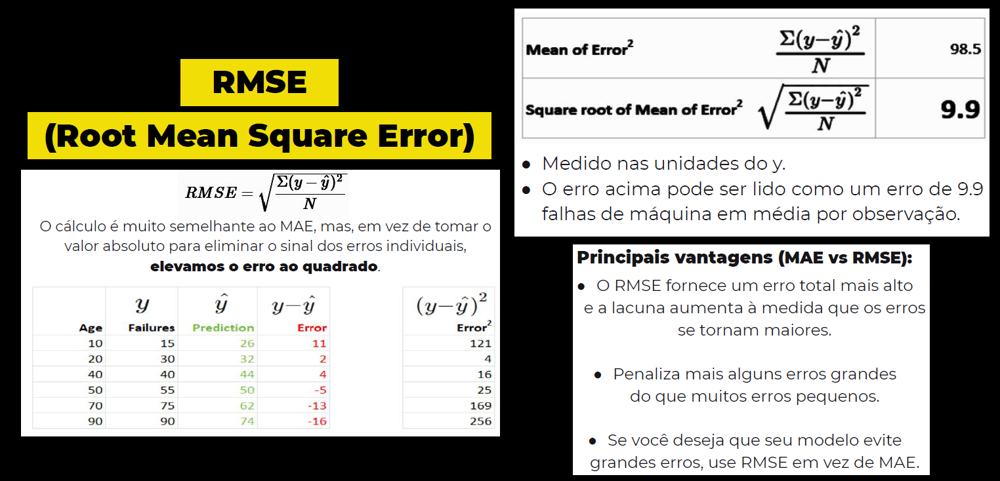

3. R² (R-Squared)

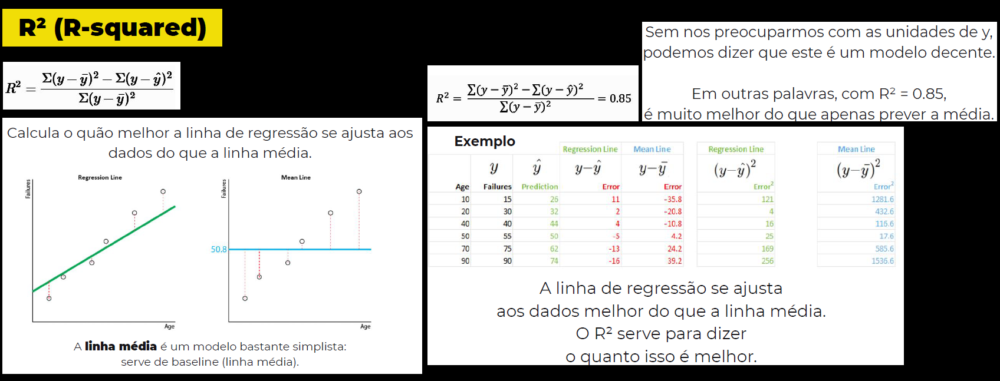

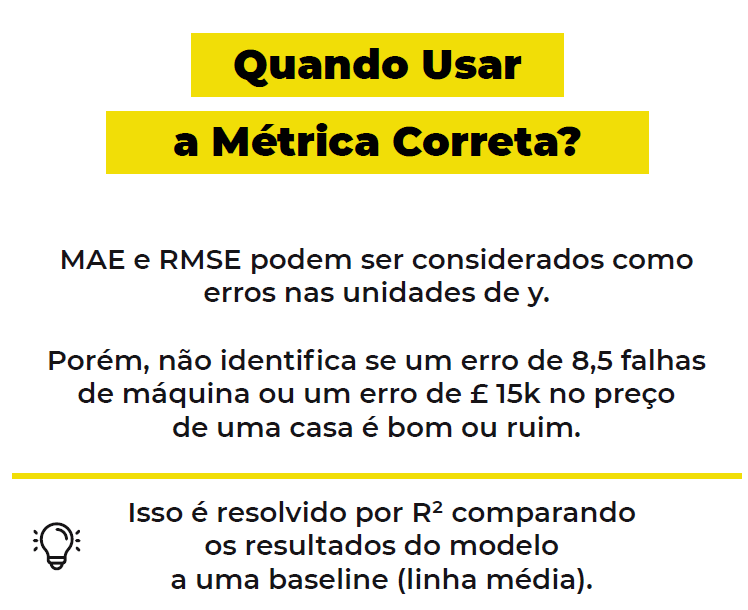

# 1- Regressão Linear Simples

A regressão linear simples tenta modelar a relação entre duas variáveis ajustando uma equação linear aos dados observados.

`aX + b = y`


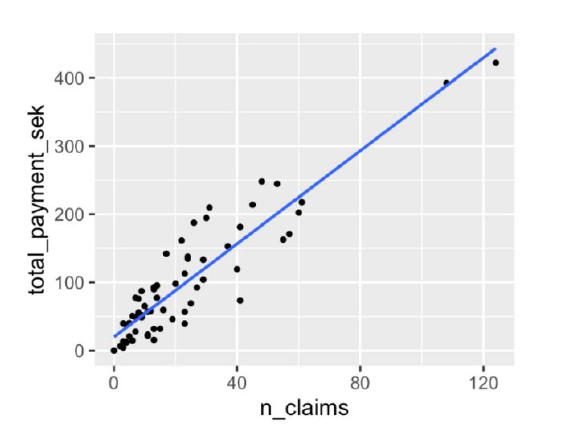

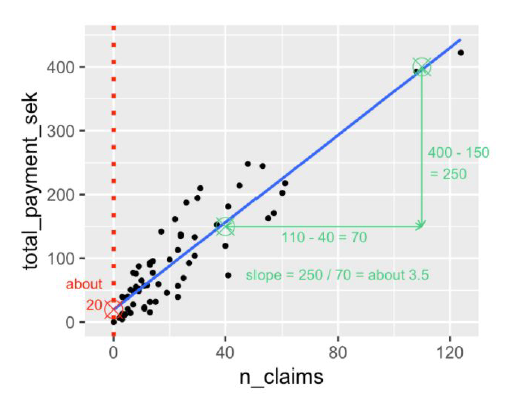

## (i) Importação do dataset através do Sklearn

In [ ]:
# Importação do dataset Boston House Pricing

from sklearn.datasets import load_boston #Ref: https://scikit-learn.org/stable/modules/generated/sklearn.datasets.load_boston.html
dataset = load_boston()
print(type(dataset))

<class 'sklearn.utils.Bunch'>


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function load_boston is deprecated; `load_boston` is deprecated in 1.0 and will be removed in 1.2.

    The Boston housing prices dataset has an ethical problem. You can refer to
    the documentation of this function for further details.

    The scikit-learn maintainers therefore strongly discourage the use of this
    dataset unless the purpose of the code is to study and educate about
    ethical issues in data science and machine learning.

    In this special case, you can fetch the dataset from the original
    source::

        import pandas as pd
        import numpy as np


        data_url = "http://lib.stat.cmu.edu/datasets/boston"
        raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
        data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
        target = raw_df.values[1::2, 2]

    Alternative datasets include the California housing dataset (i.e.

Dando uma olhada mais a fundo no tipo do dataset, vemos que ele é um *sklearn.utils.Bunch*, uma espécie de objeto do sklearn. Em seguida, acessaremos seus atributos e veremos o que eles significam.

In [ ]:
# Verificando os atributos do objeto
dataset.keys()

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename', 'data_module'])

Metadata:
- 'data': numerical data;
- 'target': The regression target;
- 'feature_names': The names of features;
- 'DESCR': The full description of the dataset;
- 'filename': The physical location of boston csv dataset;

In [ ]:
# Acessando o atributos do objeto
dataset['feature_names']

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

## (ii) Criação do DataFrame

In [ ]:
# Importação das bibliotecas
import pandas as pd

''' Descrições das colunas (Fornecidos no dataset['feature_names'])
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
        - B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
        - LSTAT    % lower status of the population
        - MEDV     Median value of owner-occupied homes in $1000's
'''

# Montagem do dataframe
df = pd.DataFrame(dataset.get('data'),columns=dataset.get('feature_names'))
df["PRICE"] = dataset.get('target')
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [ ]:
df.isna().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
PRICE      0
dtype: int64

In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  PRICE    506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


## (iii) Exploratory Data Analysis (EDA)

### a) Distribuição dos dados

In [ ]:
df.describe(percentiles=(.001,.01,.1,.25,.5,.75,.9,.99,.999))

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
0.1%,0.007704,0.000000,0.601400,0.000000,0.387020,3.713510,4.465500,1.133337,1.000000,187.505000,12.600000,1.431000,1.825950,5.000000
1%,0.013610,0.000000,1.253500,0.000000,0.398000,4.524450,6.610000,1.206540,1.000000,188.000000,13.000000,6.730000,2.883000,7.010000
10%,0.038195,0.000000,2.910000,0.000000,0.427000,5.593500,26.950000,1.628300,3.000000,233.000000,14.750000,290.270000,4.680000,12.750000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000


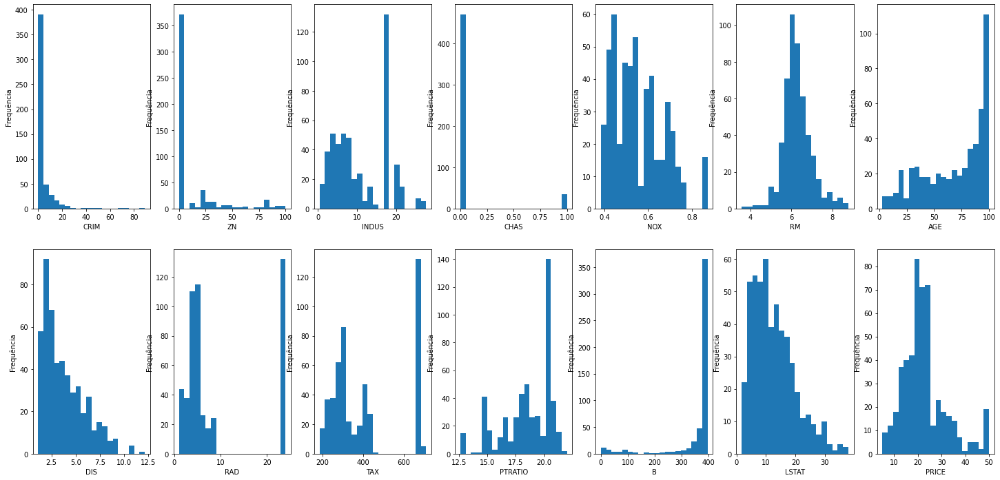

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 7 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):

      ax.hist(df.select_dtypes(include='number')[contColNames[counter]], bins=20)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

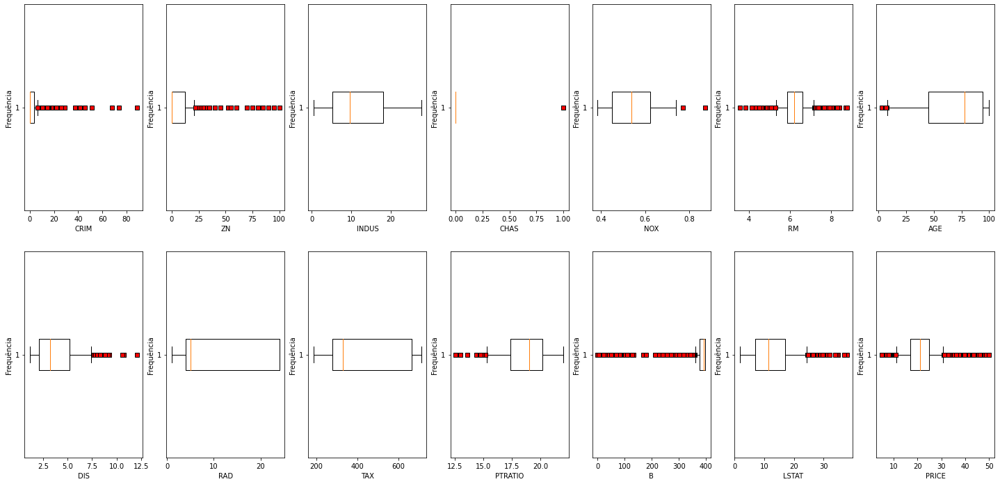

In [ ]:
contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 7 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):
      red_square = dict(markerfacecolor='r', marker='s')
      ax.boxplot(df.select_dtypes(include='number')[contColNames[counter]], flierprops=red_square, vert=False, whis=0.75)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

### b) Correlação e escolha dos atributos

De todas as colunas do nosso DataFrame, as que influenciarão num melhor desempenho no modelo serão as com maior correlação com o Preço da casa (Tanto positiva quanto negativa)

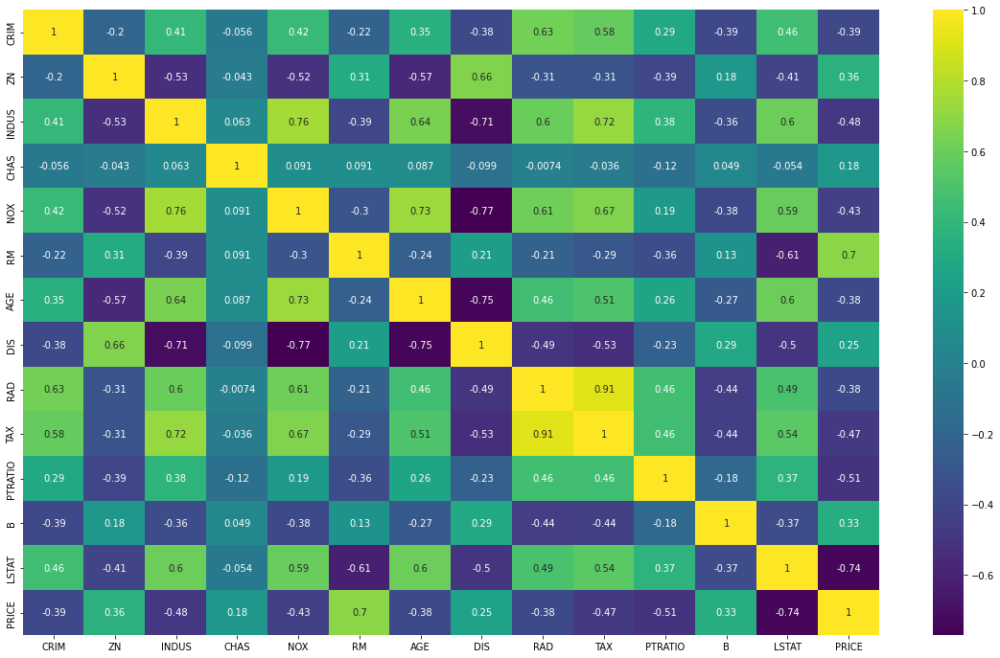

In [ ]:
import seaborn as sns
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(), annot=True, cmap='viridis')

<Figure size 1440x864 with 0 Axes>

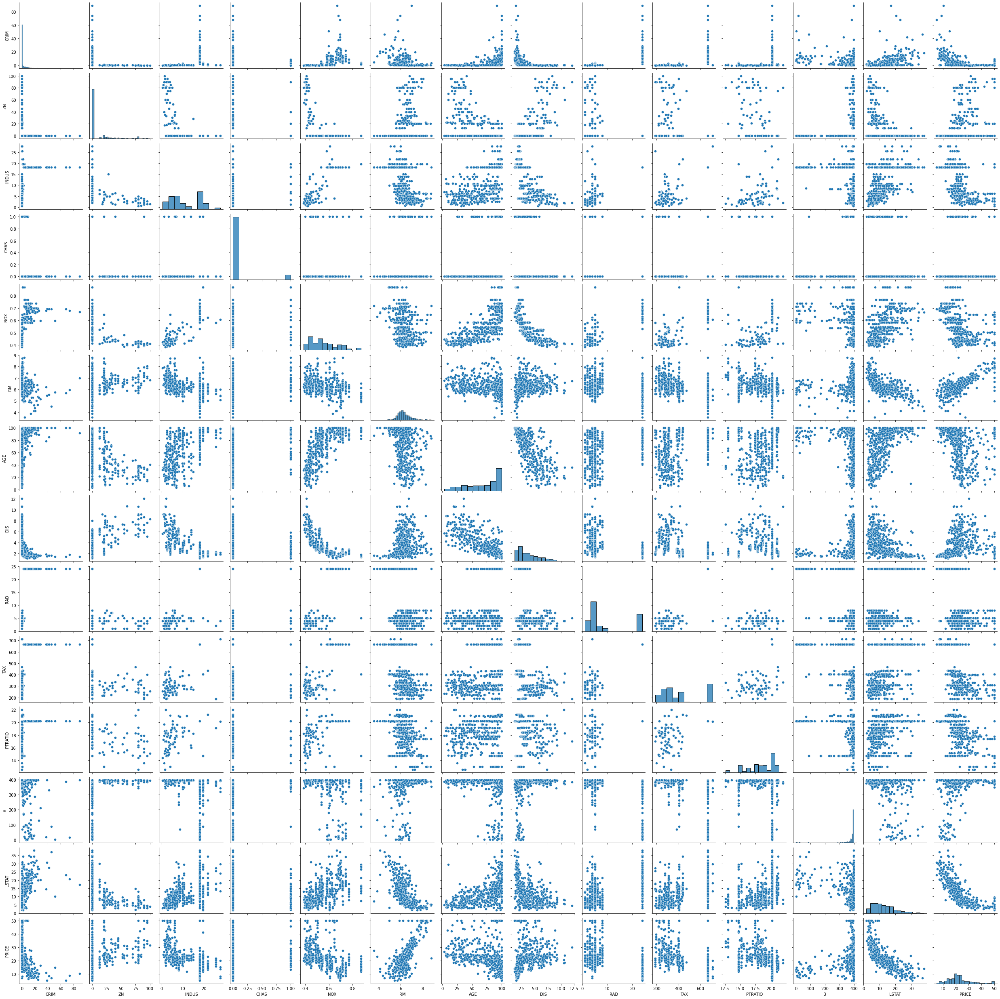

In [ ]:
plt.figure(figsize=(20,12))
sns.pairplot(df)

In [ ]:
# Visualizando as maiores correlações com Price
df.corr()['PRICE'].abs().sort_values(ascending=False)

PRICE      1.000000
LSTAT      0.737663
RM         0.695360
PTRATIO    0.507787
INDUS      0.483725
TAX        0.468536
NOX        0.427321
CRIM       0.388305
RAD        0.381626
AGE        0.376955
ZN         0.360445
B          0.333461
DIS        0.249929
CHAS       0.175260
Name: PRICE, dtype: float64

Baseado na análise de correlação, escolheremos 3 variáveis para utilizarmos como parâmetro de treinamento são elas:
- LSTAT --->     0.737663
- RM      --->   0.695360
- PTRATIO   --->  0.507787

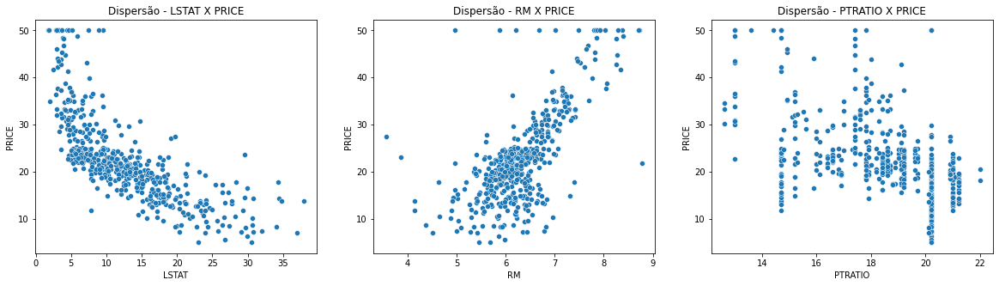

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
sns.scatterplot(x='LSTAT', y='PRICE' ,data=df)
plt.title("Dispersão - LSTAT X PRICE")

plt.subplot(1,3,2)
sns.scatterplot(x='RM', y='PRICE' ,data=df)
plt.title("Dispersão - RM X PRICE")

plt.subplot(1,3,3)
sns.scatterplot(x='PTRATIO', y='PRICE' ,data=df)
plt.title("Dispersão - PTRATIO X PRICE")

plt.show()

In [ ]:
import plotly.express as px
fig = px.scatter_3d(df, x='LSTAT', y='RM', z='PTRATIO', color='PRICE', color_continuous_scale='inferno')
fig.show()

## (iv) Separação: dados de treino e dados de teste

In [ ]:
# Separar os valores de feature e target
X = df[['LSTAT','RM','PTRATIO']]
y = df['PRICE']

print(X.head(),'\n\n\n',y.head())

   LSTAT     RM  PTRATIO
0   4.98  6.575     15.3
1   9.14  6.421     17.8
2   4.03  7.185     17.8
3   2.94  6.998     18.7
4   5.33  7.147     18.7 


 0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: PRICE, dtype: float64


In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(379, 3)
(379,)
(127, 3)
(127,)


## (v) Treinamento e validação dos modelos

Como este é um caso de regressão linear simples, isto é, uma única variável independente (X), iremos criar 3 modelos separadamente para as 3 variáveis analisadas na parte de EDA

In [ ]:
from sklearn.linear_model import LinearRegression

# Chamar a função do Modelo para cada variável
LinReg_LSTAT = LinearRegression() # Para o LSTAT
LinReg_RM = LinearRegression() # Para o RM
LinReg_PTRATIO = LinearRegression() # Para o PTRATIO

> LSTAT

In [ ]:
# Treinar o modelo
LinReg_LSTAT.fit(X_train['LSTAT'].values.reshape(-1,1),y_train)

LinearRegression()

In [ ]:
# Predizer os valores de teste
y_pred_1 = LinReg_LSTAT.predict(X_test['LSTAT'].values.reshape(-1,1))
y_pred_1

array([26.3160384 , 31.72264502, 17.45548344, 29.76998673, 18.2404717 ,
       23.44101891, 17.20036226, 11.47976033, 22.55790712, 21.12530355,
       17.60266874, 18.4072817 , -1.0996765 , 23.07796184, 23.66670303,
       23.74520186, 17.93628875,  5.14098015, 32.2721368 , 17.39660932,
       28.72006494, 28.13132374, 13.01048743, 25.69786015, 19.78101115,
       17.38679697, 26.25716428, 16.82749283, 18.2404717 , 21.35098767,
       20.77205883, 28.12151139, 21.99860298, 25.18761778, 14.26646864,
       19.69269998, 31.23202736, 25.57029955, 20.80149589, 27.78789138,
       14.443091  , 27.79770374, 32.36044798, 22.34203534, 26.54172252,
       18.39746935, 17.18073755, 28.59250435, 19.20208231, 30.29985381,
       22.16541299, 30.68253558, 16.81768048, 27.66033079, 32.08570209,
       24.804936  , 18.90771172, 31.91889209, 25.74692191, 17.07280167,
       25.86467015, 30.46666381, 31.4969609 , 23.7157648 , 29.79942379,
       12.52968212, 18.387657  , 28.59250435, 30.94746912, 16.53

In [ ]:
from sklearn import metrics

# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg_LSTAT.intercept_,LinReg_LSTAT.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred_1)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred_1)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred_1)))

Fórmula: y = 35.18640571015775 -0.9812353220320305 x
MSE: 4.5560507624182005
RMSE: 35.50838282425953
R²: 0.4929340114233606


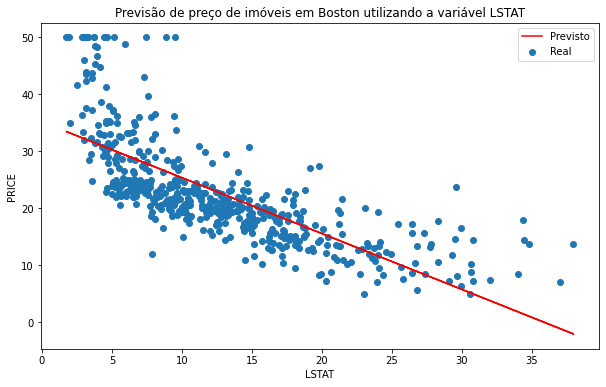

In [ ]:
y_pred_total = LinReg_LSTAT.predict(X['LSTAT'].values.reshape(-1,1))

plt.figure(figsize=(10,6))
plt.scatter('LSTAT','PRICE',data=df,label='Real')
plt.plot(df['LSTAT'],y_pred_total,label='Previsto',color='R')

plt.xlabel('LSTAT')
plt.ylabel('PRICE')
plt.title('Previsão de preço de imóveis em Boston utilizando a variável LSTAT')
plt.legend()
plt.show()

> RM

In [ ]:
# Treinar o modelo
LinReg_RM.fit(X_train['RM'].values.reshape(-1,1),y_train)

LinearRegression()

In [ ]:
# Predizer os valores de teste
y_pred_2 = LinReg_RM.predict(X_test['RM'].values.reshape(-1,1))
y_pred_2

array([23.76858826, 26.95061492, 19.73988199, 20.50282405, 22.66139185,
       22.49391676, 19.09789415, 21.51697875, 22.02870818, 20.14926553,
       19.4421485 , 19.93526959,  6.11857487, 22.0566207 , 17.18123481,
       29.016141  , 18.77224815,  9.47738079, 37.34337452, 21.61932463,
       22.13105407, 24.38266358, 17.22775567, 25.41542662, 19.95387793,
       14.56676262, 18.72572729, 26.67148977, 19.52588604, 17.98139357,
       15.91586749, 23.86162997, 32.11443012, 13.96199147, 19.92596542,
       17.19053899, 30.92349616, 18.67920643, 20.49351988, 22.17757493,
       14.22250827, 27.79729453, 38.82273779, 16.12055926, 23.77789243,
       17.22775567, 17.11610561, 23.77789243, 21.45184955, 25.24795153,
       19.98179045, 28.90449094, 21.21924526, 27.16461087, 33.57518505,
       22.80095442, 21.93566647, 27.90894459, 23.51737563, 16.22290515,
       26.98783161, 31.51896314, 25.03395559, 14.83658359, 25.28516822,
       13.79451638, 24.28031769, 22.7079127 , 25.43403496, 19.67

In [ ]:
from sklearn import metrics

# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg_RM.intercept_,LinReg_RM.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred_2)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred_2)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred_2)))

Fórmula: y = -35.9269762745408 9.304171529330434 x
MSE: 4.269376143548842
RMSE: 42.74963952740483
R²: 0.38952758463985193


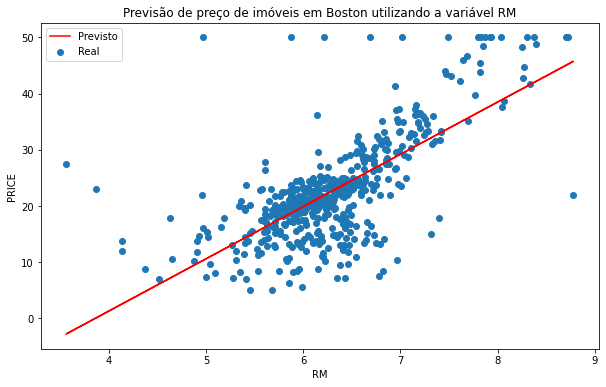

In [ ]:
y_pred_total = LinReg_RM.predict(X['RM'].values.reshape(-1,1))

plt.figure(figsize=(10,6))
plt.scatter('RM','PRICE',data=df,label='Real')
plt.plot(df['RM'],y_pred_total,label='Previsto',color='R')

plt.xlabel('RM')
plt.ylabel('PRICE')
plt.title('Previsão de preço de imóveis em Boston utilizando a variável RM')
plt.legend()
plt.show()

> PTRATIO

In [ ]:
# Treinar o modelo
LinReg_PTRATIO.fit(X_train['PTRATIO'].values.reshape(-1,1),y_train)

LinearRegression()

In [ ]:
# Predizer os valores de teste
y_pred_3 = LinReg_PTRATIO.predict(X_test['PTRATIO'].values.reshape(-1,1))
y_pred_3

array([26.28698609, 24.25611433, 19.17893496, 21.00671953, 18.97584778,
       22.02215541, 22.63141693, 16.94497603, 18.97584778, 21.00671953,
       26.69316044, 29.13020654, 18.97584778, 22.02215541, 20.19437083,
       18.97584778, 21.20980671, 18.97584778, 30.75490394, 18.97584778,
       22.22524258, 24.25611433, 17.35115038, 17.35115038, 18.97584778,
       18.97584778, 22.02215541, 18.97584778, 22.22524258, 21.00671953,
       26.28698609, 20.19437083, 18.97584778, 18.97584778, 18.97584778,
       30.14564241, 23.84993998, 18.97584778, 22.22524258, 21.00671953,
       21.00671953, 22.63141693, 30.14564241, 21.61598106, 23.84993998,
       18.97584778, 17.35115038, 21.00671953, 18.97584778, 28.92711936,
       29.13020654, 29.73946806, 17.35115038, 17.55423755, 33.59812439,
       18.97584778, 18.97584778, 21.00671953, 22.42832976, 21.20980671,
       19.99128366, 23.64685281, 24.66228868, 17.35115038, 22.83450411,
       22.22524258, 18.97584778, 21.41289388, 22.83450411, 18.97

In [ ]:
from sklearn import metrics

# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg_PTRATIO.intercept_,LinReg_PTRATIO.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred_3)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred_3)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred_3)))

Fórmula: y = 59.99945716378395 -2.030871751672077 x
MSE: 5.156910293078526
RMSE: 48.19158139794898
R²: 0.3118156919856243


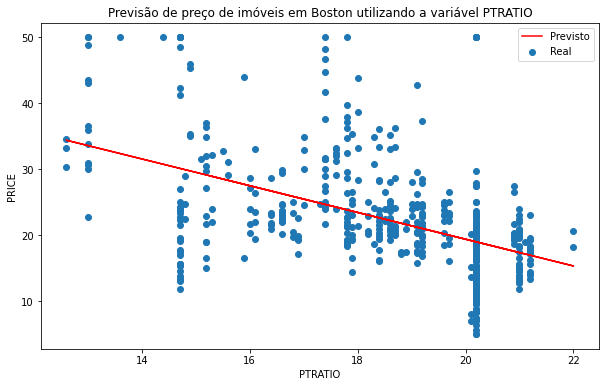

In [ ]:
y_pred_total = LinReg_PTRATIO.predict(X['PTRATIO'].values.reshape(-1,1))

plt.figure(figsize=(10,6))
plt.scatter('PTRATIO','PRICE',data=df,label='Real')
plt.plot(df['PTRATIO'],y_pred_total,label='Previsto',color='R')

plt.xlabel('PTRATIO')
plt.ylabel('PRICE')
plt.title('Previsão de preço de imóveis em Boston utilizando a variável PTRATIO')
plt.legend()
plt.show()

> Resumindo

Fórmula: y = 35.18640571015775 -0.9812353220320305 x
MSE: 4.5560507624182005
RMSE: 35.50838282425953
R²: 0.4929340114233606


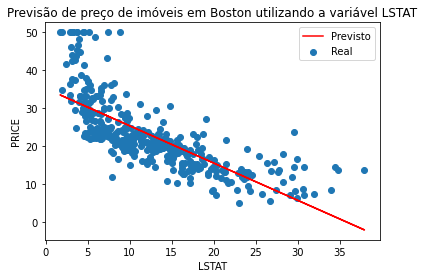

Fórmula: y = -35.9269762745408 9.304171529330434 x
MSE: 4.269376143548842
RMSE: 42.74963952740483
R²: 0.38952758463985193


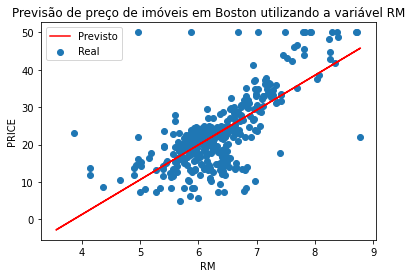

Fórmula: y = 59.99945716378395 -2.030871751672077 x
MSE: 5.156910293078526
RMSE: 48.19158139794898
R²: 0.3118156919856243


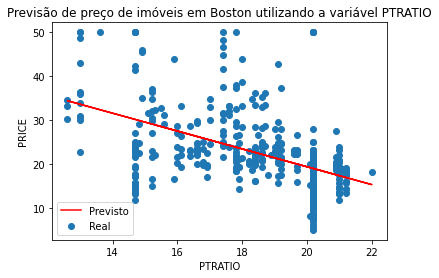

In [ ]:
# Chamar a função do Modelo
LinReg = LinearRegression() # Para o LSTAT


for i in X.columns:
  # Treinar o modelo
  LinReg.fit(X_train[i].values.reshape(-1,1),y_train)

  # Predizer os valores de teste
  y_pred = LinReg.predict(X_test[i].values.reshape(-1,1))

  # Calcular as métricas do modelo
  print("Fórmula: y = {} {} x".format(LinReg.intercept_,LinReg.coef_[0]))
  print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
  print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
  print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

  #X_norm = scaler.transform(X[i])

  y_pred_total = LinReg.predict(X[i].values.reshape(-1,1))
  plt.scatter(X_train[i],y_train,label='Real')
  plt.plot(X[i],y_pred_total,label='Previsto',color='R')
  plt.xlabel(i)
  plt.ylabel('PRICE')
  plt.title('Previsão de preço de imóveis em Boston utilizando a variável ' + i)
  plt.legend()

  plt.show()


Como podemos observar o melhor regressor foi o modelo do LSTAT. Entretanto, é válido ressaltar que esta foi uma regressão linear SIMPLES, portanto as métricas poderiam ser melhoradas caso nosso X contivesse mais features

# 2- Regressão Linear Categórica

Características gerais:

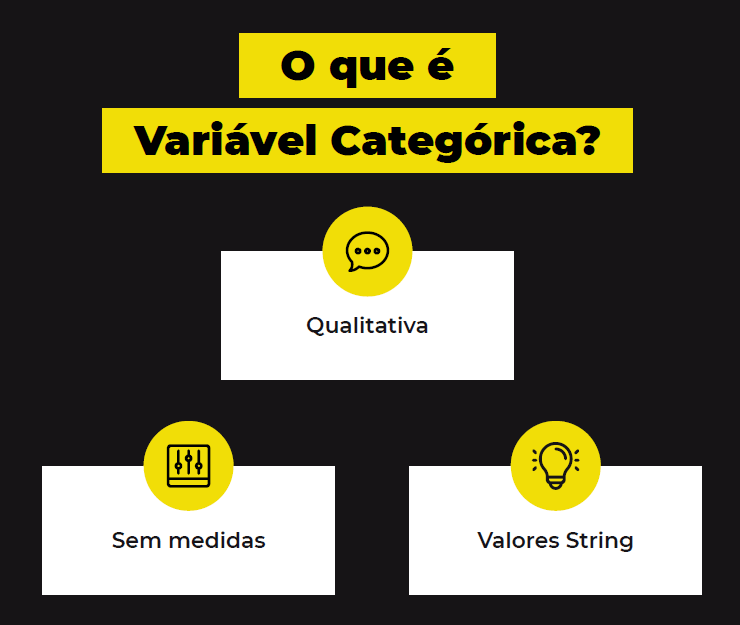

## (i) Importação das bibliotecas

In [ ]:
# Main Libraries

import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression #Ref: https://scikit-learn.org/stable/modules/linear_model.html
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler #Ref: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.simplefilter("ignore")

## (ii) Criação do DataFrame

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/rmadan16/LinearRegression_CarPrice/master/CarPrice_Assignment.csv')
df

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0


In [ ]:
df.isna().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

## (iii) Exploratory Data Analysis (EDA)

### a) Distribuição geral

In [ ]:
df.drop(['car_ID'], axis=1).describe(percentiles=(.001,.01,.1,.25,.5,.75,.9,.99,.999))

,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
0.1%,-2.000000,86.600000,141.814000,60.606000,48.004000,1533.900000,62.836000,2.568560,2.094480,7.000000,48.816000,4150.000000,13.204000,16.000000,5124.732000
1%,-1.960000,88.408000,144.816000,62.536000,48.824000,1819.720000,70.000000,2.910000,2.196800,7.000000,52.120000,4150.000000,14.040000,17.040000,5201.120000
10%,-1.000000,93.700000,157.300000,63.800000,50.600000,1947.000000,91.000000,2.970000,2.882000,8.000000,68.000000,4500.000000,17.000000,23.000000,6657.000000
25%,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000


### b) Distribuição do preço de acordo com o carbody

In [ ]:
df[['carbody','price']]

,carbody,price
0,convertible,13495.0
1,convertible,16500.0
2,hatchback,16500.0
3,sedan,13950.0
4,sedan,17450.0
...,...,...
200,sedan,16845.0
201,sedan,19045.0
202,sedan,21485.0
203,sedan,22470.0


In [ ]:
df[['carbody']].value_counts()

carbody    
sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
dtype: int64

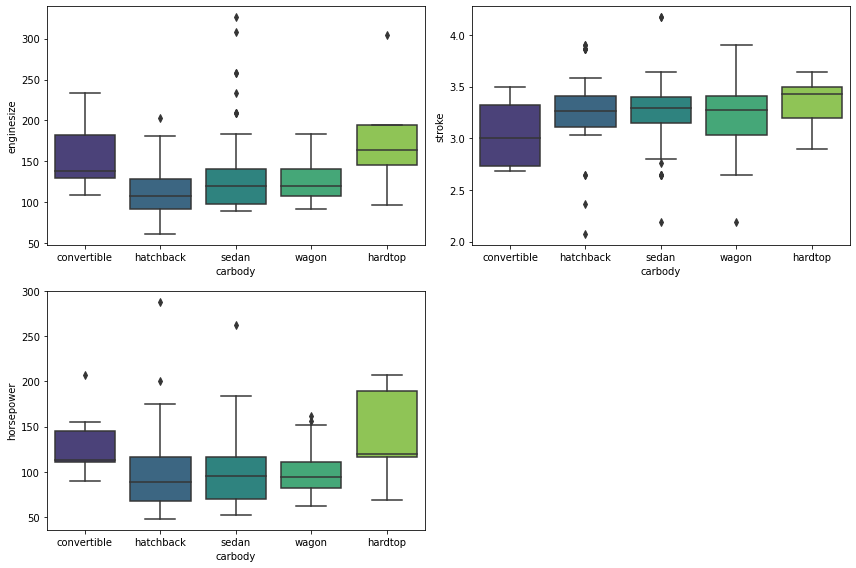

In [ ]:
ax = plt.figure(figsize=(12,8))
plt.subplot(2,2,1)
sns.boxplot(data=df, y="enginesize", x="carbody", palette="viridis")

plt.subplot(2,2,2)
sns.boxplot(data=df, y="stroke", x="carbody", palette="viridis")

plt.subplot(2,2,3)
sns.boxplot(data=df, y = "horsepower", x="carbody", palette="viridis")


plt.tight_layout()
plt.show()

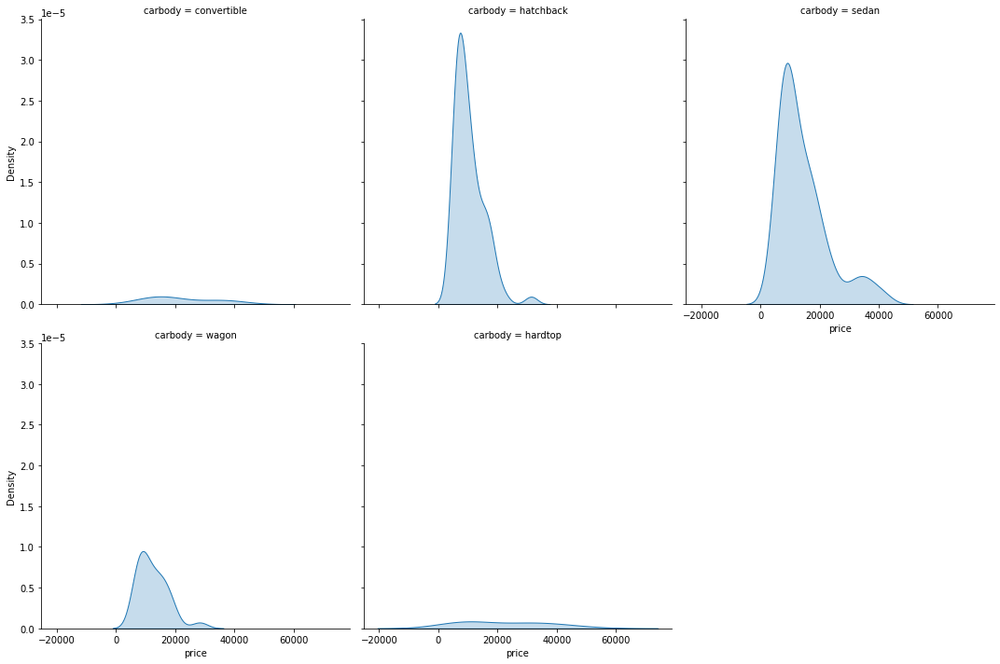

In [ ]:
sns.displot(data = df,
            x = 'price',
            col = 'carbody',
            col_wrap = 3,
            kind = 'kde',
            fill=True)
plt.show()

### c) Correlação

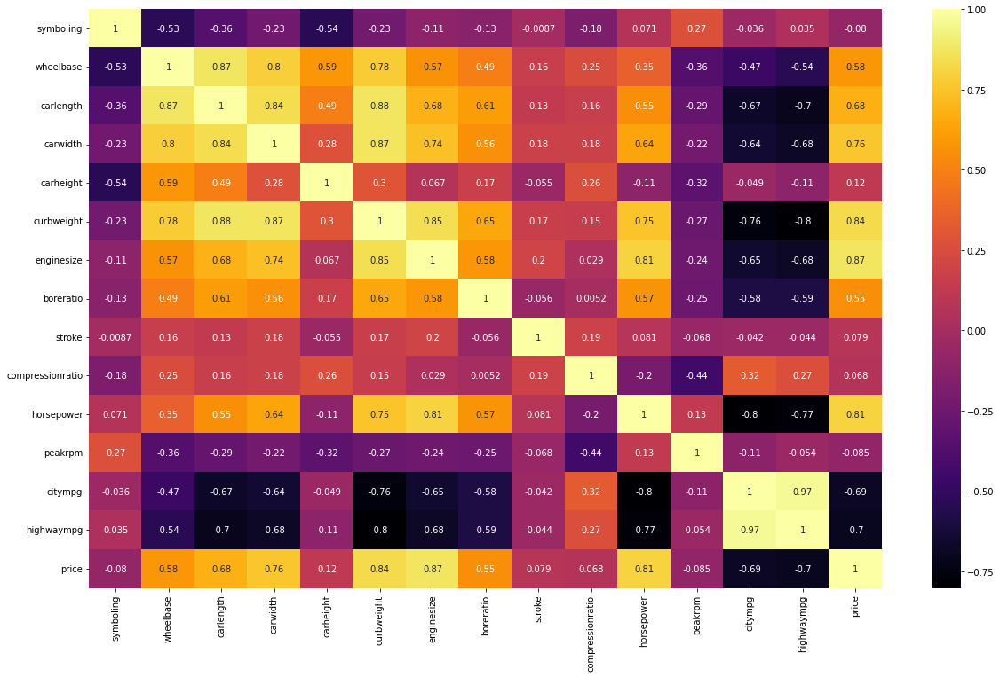

In [ ]:
plt.figure(figsize=(20,12))
sns.heatmap(df.drop(['car_ID'], axis=1).corr(), annot=True, cmap='inferno')

<Figure size 1440x864 with 0 Axes>

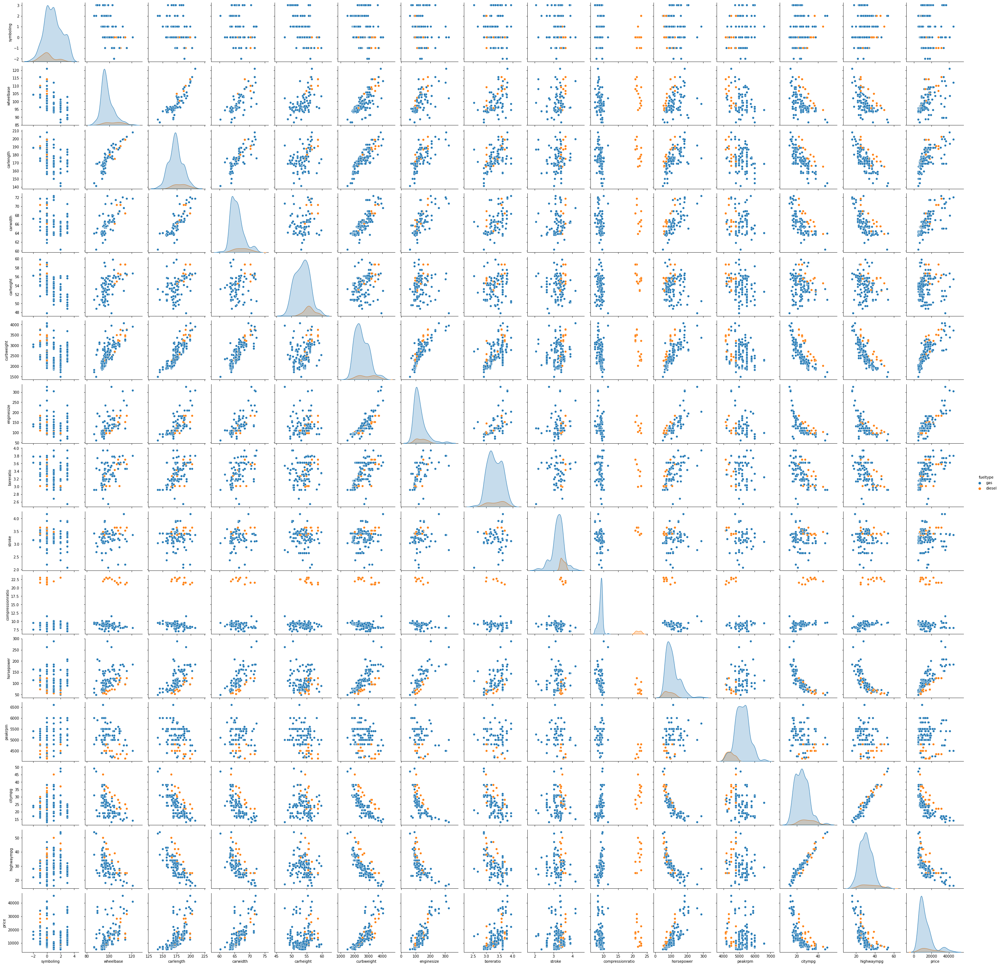

In [ ]:
plt.figure(figsize=(20,12))
sns.pairplot(df.drop(['car_ID'], axis=1), hue='fueltype')

## (iv) Feature Extraction

### a) OneHotEncoding

Para o processo iremos apenas aplicar a transformação sobre as variações do carbody para deixar o modelo menos pesado, entretanto num caso mais específico teríamos que ou transformar todas as variáveis categóricas com esse processo, ou aplicar a contagem pela frequência (no caso de a categoria em específico apresentar muita variação como o nome de uma cidade por ex)

> Get-Dummies Pandas

In [ ]:
df_tf = pd.get_dummies(df['carbody'])
df_tf['price'] = df['price']
df_tf.head()

,convertible,hardtop,hatchback,sedan,wagon,price
0,1,0,0,0,0,13495.0
1,1,0,0,0,0,16500.0
2,0,0,1,0,0,16500.0
3,0,0,0,1,0,13950.0
4,0,0,0,1,0,17450.0


> One Hot Encoder Scikit Learn

In [ ]:
enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(df['carbody'].values.reshape(-1,1))

OneHotEncoder(handle_unknown='ignore')

In [ ]:
df_tf = pd.DataFrame(enc.transform(df['carbody'].values.reshape(-1,1)).toarray().astype(int),columns=enc.categories_)
df_tf['price'] = df['price']
df_tf.head()

,convertible,hardtop,hatchback,sedan,wagon,price
0,1,0,0,0,0,13495.0
1,1,0,0,0,0,16500.0
2,0,0,1,0,0,16500.0
3,0,0,0,1,0,13950.0
4,0,0,0,1,0,17450.0


## (v) Separação: dados de treino e dados de teste

In [ ]:
# Separar os valores de feature e target
X = df_tf.drop(['price'], axis=1)
y = df.price

print(X.head(),'\n\n\n',y.head())

   convertible  hardtop  hatchback  sedan  wagon
0            1        0          0      0      0
1            1        0          0      0      0
2            0        0          1      0      0
3            0        0          0      1      0
4            0        0          0      1      0 


 0    13495.0
1    16500.0
2    16500.0
3    13950.0
4    17450.0
Name: price, dtype: float64


In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(153, 5)
(153,)
(52, 5)
(52,)


## (vi) Treinamento e validação dos modelos

In [ ]:
from sklearn.linear_model import LinearRegression

# Chamar a função do Modelo para cada variável
LinReg = LinearRegression()

In [ ]:
# Treinar o modelo
LinReg.fit(X_train,y_train)

LinearRegression()

In [ ]:
# Predizer os valores de teste
y_pred = LinReg.predict(X_test)
y_pred

array([14080., 10240., 14080., 10240., 13184., 10240., 10240., 14080.,
       13184., 14080., 14080., 10240., 14080., 10240., 14080., 10240.,
       10240., 10240., 14080., 14080., 14080., 14080., 24192., 10240.,
       14080., 14080., 24192., 13184., 13184., 14080., 14080., 10240.,
       13184., 14080., 10240., 24192., 14080., 10240., 14080., 10240.,
       13184., 14080., 14080., 13184., 14080., 10240., 10240., 10240.,
       14080., 10240., 10240., 10240.])

In [ ]:
from sklearn import metrics

# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg.intercept_,LinReg.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

Fórmula: y = 1.025016312340271e+18 -1.0250163123402491e+18 x
MSE: 5723.1089807692315
RMSE: 65169386.71199787
R²: 0.036804126723687824


# 3- Algoritmo Ordinary Least Squares (OLS)

Características Gerais:

- Equação geral para uma regressão linear simples pode ser definida como:

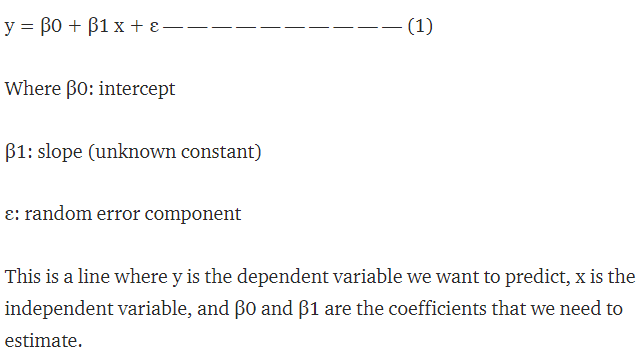

- Para estimar os valores de `beta_0` e `beta_1`, que são os coeficientes lineares, devemos minimizar a soma do quadrado dos erros/resíduos (e, consequentemente, a distância de cada ponto à linha de regressão):

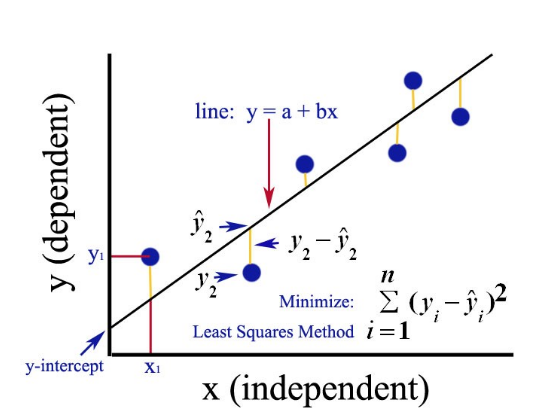

Referência: https://medium.com/analytics-vidhya/ordinary-least-square-ols-method-for-linear-regression-ef8ca10aadfc


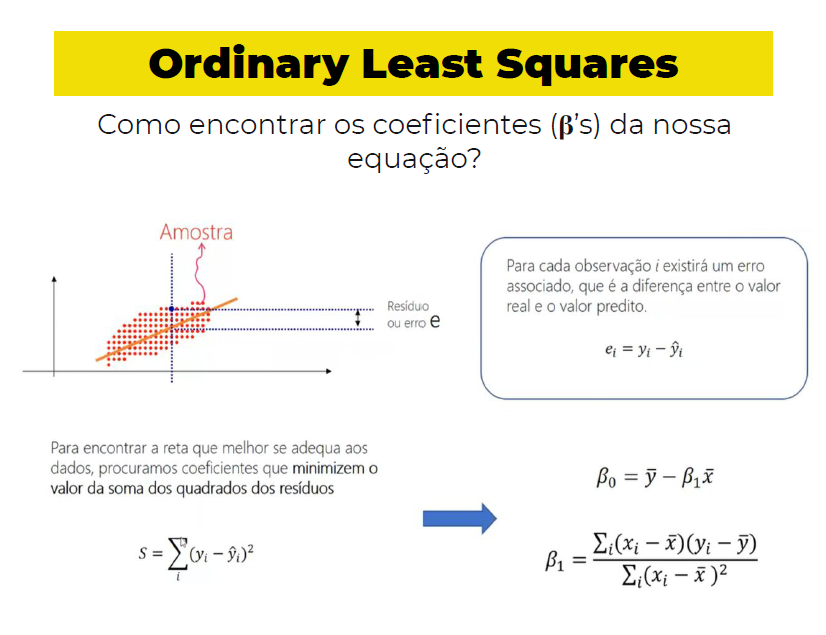

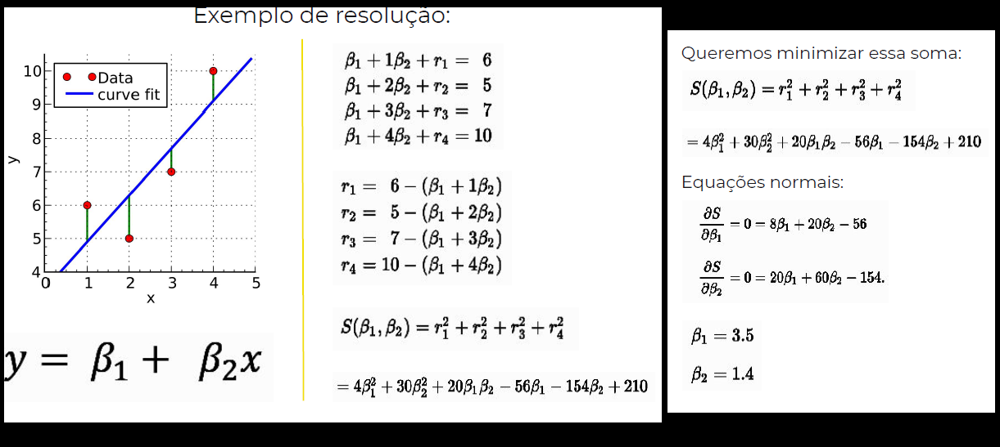

## (i) Importação das Bibliotecas

In [ ]:
# Main Libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.simplefilter("ignore")

## (ii) Criação do DataFrame

Este [dataset](https://www.kaggle.com/dongeorge/beer-consumption-sao-paulo) é um conjunto de dados fornecidos no [Kaggle](https://www.kaggle.com/), uma plataforma voltada a competição de programação e acesso à conjunto de dados de todo o mundo. É totalmente gratuito e apresenta uma forte comunidade de Cientistas de Dados e Machine Learning.

Sobre os dados, eles foram criados coletando dados sobre o consumo de cerveja na cidade de São Paulo na uma área universitária, cujos frequentadores eram, em sua média, estudantes entre 18 e 28 anos.

Esse dataset, apresenta as categorias como:

| Descrição
| ---
| Dia que o dado foi anotado
| Temperatura média do dia em ºC
| Temperatura mínima do dia em ºC
| Temperatura máxima do dia em ºC
| Quantos mm chuva caiu naquele dia
| Verificar se for Sábado ou Domingo
| Consumo de cerveja em litros

In [ ]:
# Lendo o nosso dataset
df = pd.read_csv("Consumo_cerveja.csv")
df

,Data,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Final de Semana,Consumo de cerveja (litros)
0,2015-01-01,"27,3","23,9","32,5",0,0.0,25.461
1,2015-01-02,"27,02","24,5","33,5",0,0.0,28.972
2,2015-01-03,"24,82","22,4","29,9",0,1.0,30.814
3,2015-01-04,"23,98","21,5","28,6","1,2",1.0,29.799
4,2015-01-05,"23,82",21,"28,3",0,0.0,28.900
...,...,...,...,...,...,...,...
936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
938,NaN,NaN,NaN,NaN,NaN,NaN,NaN
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print('Informações sobre o dataset: \n')
print('Número de dados: \t {}\n'.format(df.shape[0]))
print('Número de colunas: \t {}\n'.format(df.shape[1]))
print('Valores ausentes por coluna: \n{}\n'.format(df.isnull().sum()))
df.info(verbose=True)

Informações sobre o dataset: 

Número de dados: 	 941

Número de colunas: 	 7

Valores ausentes por coluna: 
Data                           576
Temperatura Media (C)          576
Temperatura Minima (C)         576
Temperatura Maxima (C)         576
Precipitacao (mm)              576
Final de Semana                576
Consumo de cerveja (litros)    576
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 941 entries, 0 to 940
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Data                         365 non-null    object 
 1   Temperatura Media (C)        365 non-null    object 
 2   Temperatura Minima (C)       365 non-null    object 
 3   Temperatura Maxima (C)       365 non-null    object 
 4   Precipitacao (mm)            365 non-null    object 
 5   Final de Semana              365 non-null    float64
 6   Consumo de cerveja (litros)  365 non-null    float64
dtypes

## (iii) Data Cleaning

### a) Remoção de Nulos

In [ ]:
df.tail(5)

,Data,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Final de Semana,Consumo de cerveja (litros)
936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
938,NaN,NaN,NaN,NaN,NaN,NaN,NaN
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN
940,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_clean = df.copy()
df_clean.dropna(axis=0,inplace=True)
df_clean.tail(3)

,Data,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Final de Semana,Consumo de cerveja (litros)
362,2015-12-29,"21,68","20,3","24,1","10,3",0.0,22.309
363,2015-12-30,"21,38","19,3","22,4","6,3",0.0,20.467
364,2015-12-31,"24,76","20,2",29,0,0.0,22.446


### b) Conversão dados corretamente

In [ ]:
# Dtype = object -> Formato string
df_clean.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 365 entries, 0 to 364
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Data                         365 non-null    object 
 1   Temperatura Media (C)        365 non-null    object 
 2   Temperatura Minima (C)       365 non-null    object 
 3   Temperatura Maxima (C)       365 non-null    object 
 4   Precipitacao (mm)            365 non-null    object 
 5   Final de Semana              365 non-null    float64
 6   Consumo de cerveja (litros)  365 non-null    float64
dtypes: float64(2), object(5)
memory usage: 22.8+ KB


In [ ]:
# Transformação da data para o formato datetime
df_clean['Data'] = pd.to_datetime(df_clean['Data'], format="%Y-%m-%d")

# Transformação dos dados para tipo float
df_clean['Temperatura Media (C)']     = df_clean['Temperatura Media (C)'].str.replace(',','.').astype(float)
df_clean['Temperatura Minima (C)']     = df_clean['Temperatura Minima (C)'].str.replace(',','.').astype(float)
df_clean['Temperatura Maxima (C)']     = df_clean['Temperatura Maxima (C)'].str.replace(',','.').astype(float)
df_clean['Precipitacao (mm)'] = df_clean['Precipitacao (mm)'].str.replace(',','.').astype(float)

# - Outra forma - Utilizar no começo
# df = pd.read_csv("Consumo_cerveja.csv",decimal=",")

# Transformação dos dados para tipo int
df_clean['Final de Semana'] = df_clean['Final de Semana'].astype(int)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 365 entries, 0 to 364
Data columns (total 7 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Data                         365 non-null    datetime64[ns]
 1   Temperatura Media (C)        365 non-null    float64       
 2   Temperatura Minima (C)       365 non-null    float64       
 3   Temperatura Maxima (C)       365 non-null    float64       
 4   Precipitacao (mm)            365 non-null    float64       
 5   Final de Semana              365 non-null    int64         
 6   Consumo de cerveja (litros)  365 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 22.8 KB


In [ ]:
df_clean.head()

,Data,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Final de Semana,Consumo de cerveja (litros)
0,2015-01-01,27.30,23.9,32.5,0.0,0,25.461
1,2015-01-02,27.02,24.5,33.5,0.0,0,28.972
2,2015-01-03,24.82,22.4,29.9,0.0,1,30.814
3,2015-01-04,23.98,21.5,28.6,1.2,1,29.799
4,2015-01-05,23.82,21.0,28.3,0.0,0,28.900


## (iv) Exploratory Data Analysis (EDA)

### a) Distribuição Geral

In [ ]:
df_clean.drop(['Data','Final de Semana'], axis=1).describe(percentiles=(.001,.01,.1,.25,.5,.75,.9,.99,.999))

,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Consumo de cerveja (litros)
count,365.000000,365.000000,365.000000,365.000000,365.000000
mean,21.226356,17.461370,26.611507,5.196712,25.401367
std,3.180108,2.826185,4.317366,12.417844,4.399143
min,12.900000,10.600000,14.500000,0.000000,14.343000
0.1%,13.300400,10.709200,14.900400,0.000000,14.560308
1%,14.532800,11.000000,16.932000,0.000000,16.881120
10%,16.776000,13.640000,20.540000,0.000000,20.298800
25%,19.020000,15.300000,23.800000,0.000000,22.008000
50%,21.380000,17.900000,26.900000,0.000000,24.867000
75%,23.280000,19.600000,29.400000,3.200000,28.631000


### b) Correlação

Consumo de cerveja (litros)    1.000000
Temperatura Maxima (C)         0.642672
Temperatura Media (C)          0.574615
Final de Semana                0.505981
Temperatura Minima (C)         0.392509
Precipitacao (mm)             -0.193784
Name: Consumo de cerveja (litros), dtype: float64


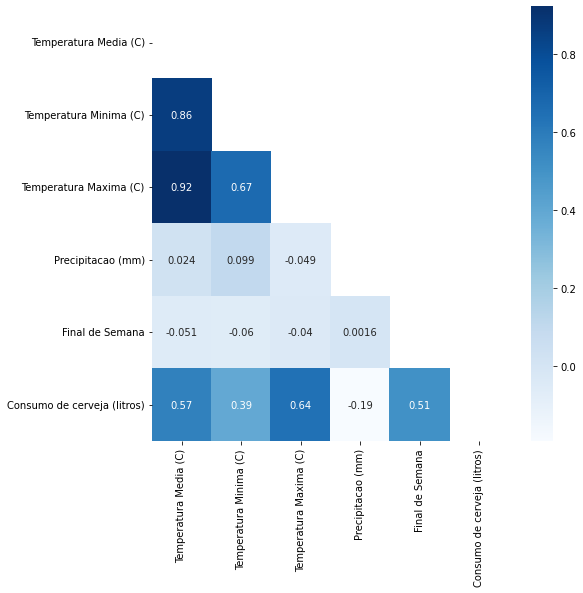

In [ ]:
print(df_clean.corr()['Consumo de cerveja (litros)'].sort_values(ascending = False))

correlation = df_clean.corr()

f, ax = plt.subplots(figsize=(8, 8))

# Cria uma máscara para camuflar a parte de cima do mapa

mask = np.triu(np.ones_like(correlation,dtype=bool))

# Plot do mapa de calor

sns.heatmap(correlation,cmap='Blues',mask=mask, square=False,annot=True);

### c) Curvas de Flutuação das Variáveis ao Longo do Tempo

> TimeSeries do consumo

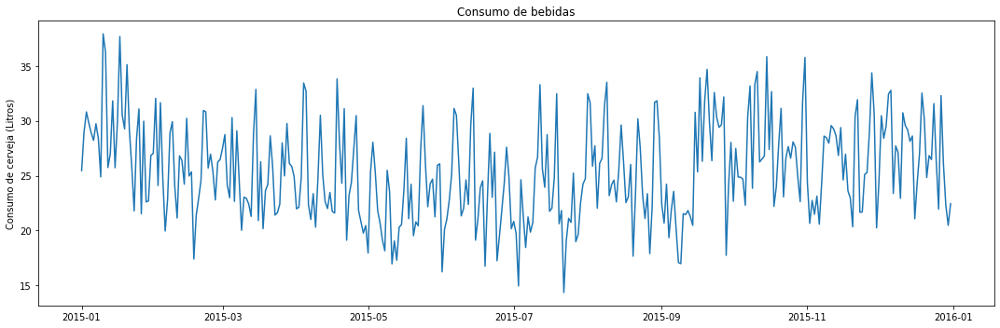

In [ ]:
plt.figure(figsize=(15,5))

color_blue = 'cornflowerblue'
# Visualização do consumo durante todo o ano
plt.plot_date(x='Data',y='Consumo de cerveja (litros)',data=df_clean,fmt='-');
plt.title('Consumo de bebidas')
plt.ylabel('Consumo de cerveja (Litros)')

plt.tight_layout()
plt.show()

> TimeSeries das variáveis externas

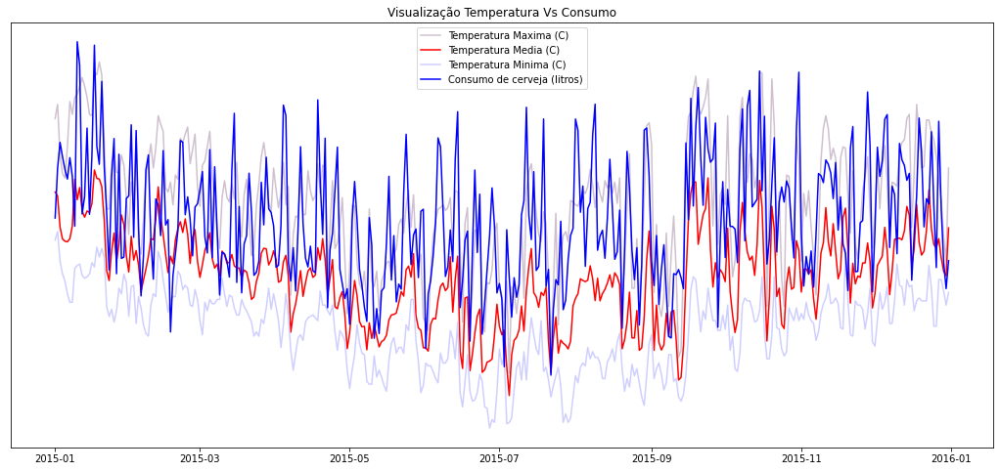

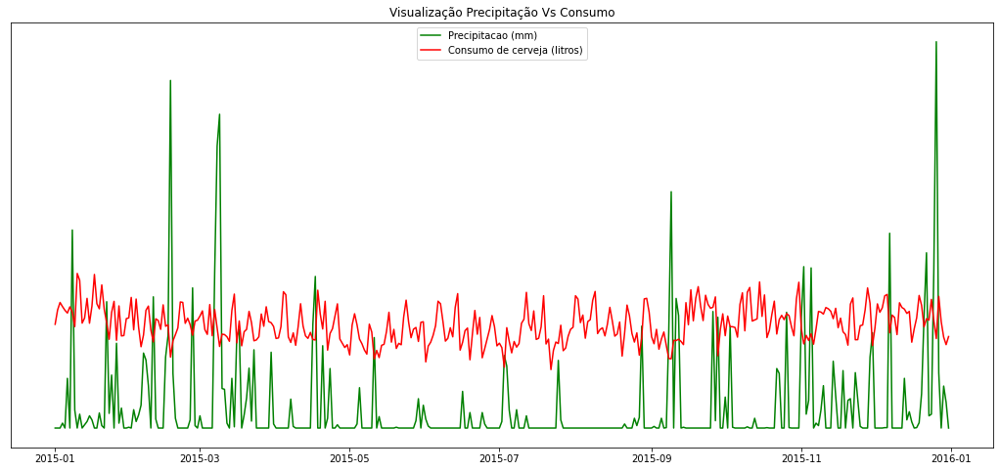

In [ ]:
plt.figure(figsize=(18,8))
plt.gca().axes.get_yaxis().set_visible(False)
plt.plot_date(x='Data',y='Temperatura Maxima (C)',data=df_clean,fmt='-',c='#CFC0D0');
plt.plot_date(x='Data',y='Temperatura Media (C)',data=df_clean,fmt='-',c='r');
plt.plot_date(x='Data',y='Temperatura Minima (C)',data=df_clean,fmt='-',c='#CFCFFF');
plt.plot_date(x='Data',y='Consumo de cerveja (litros)',data=df_clean,fmt='-',c='#0000FF');
plt.title("Visualização Temperatura Vs Consumo")
plt.legend(loc='upper center')



plt.figure(figsize=(18,8))
plt.plot_date(x='Data',y='Precipitacao (mm)',data=df_clean,fmt='-',c='g');
plt.plot_date(x='Data',y='Consumo de cerveja (litros)',data=df_clean,fmt='-',c='r');
plt.title("Visualização Precipitação Vs Consumo")
plt.gca().axes.get_yaxis().set_visible(False)
plt.legend(loc='upper center')


plt.show()

## (v) Separação: dados de treino e dados de teste

In [ ]:
# Separar os valores de feature e target
X = df_clean.drop(['Consumo de cerveja (litros)','Data'], axis=1)
y = df_clean['Consumo de cerveja (litros)']

print(X.head(),'\n\n\n',y.head())

   Temperatura Media (C)  ...  Final de Semana
0                  27.30  ...                0
1                  27.02  ...                0
2                  24.82  ...                1
3                  23.98  ...                1
4                  23.82  ...                0

[5 rows x 5 columns] 


 0    25.461
1    28.972
2    30.814
3    29.799
4    28.900
Name: Consumo de cerveja (litros), dtype: float64


In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(273, 5)
(273,)
(92, 5)
(92,)


## (vi) Treinamento e validação dos modelos

In [ ]:
import statsmodels.api as sm #https://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.html 

# Especificação do modelo 
model = sm.OLS(y_train, X_train)

# Executa o método dos mínimos quadrados
reg = model.fit()

In [ ]:
print(reg.summary())

                                     OLS Regression Results                                     
Dep. Variable:     Consumo de cerveja (litros)   R-squared (uncentered):                   0.990
Model:                                     OLS   Adj. R-squared (uncentered):              0.990
Method:                          Least Squares   F-statistic:                              5536.
Date:                         Sat, 05 Feb 2022   Prob (F-statistic):                   4.20e-268
Time:                                 00:48:29   Log-Likelihood:                         -637.23
No. Observations:                          273   AIC:                                      1284.
Df Residuals:                              268   BIC:                                      1302.
Df Model:                                    5                                                  
Covariance Type:                     nonrobust                                                  
                             c

In [ ]:
y_pred = reg.predict(X_test)
y_pred

193    25.519709
33     27.373554
15     29.439652
309    21.000536
57     28.081984
         ...    
255    20.501740
301    22.552718
110    25.905369
321    27.054184
60     25.890331
Length: 92, dtype: float64

In [ ]:
from sklearn import metrics

print("MAE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
print("MSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

MAE: 2.093208394169001
MSE: 6.299061642887172
R²: 0.7204174636717782


# 4- Regressão Linear com Dimensões Múltiplas

Características Gerais:

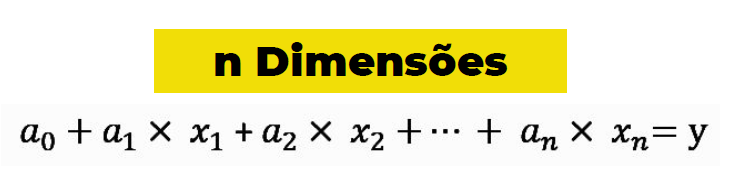

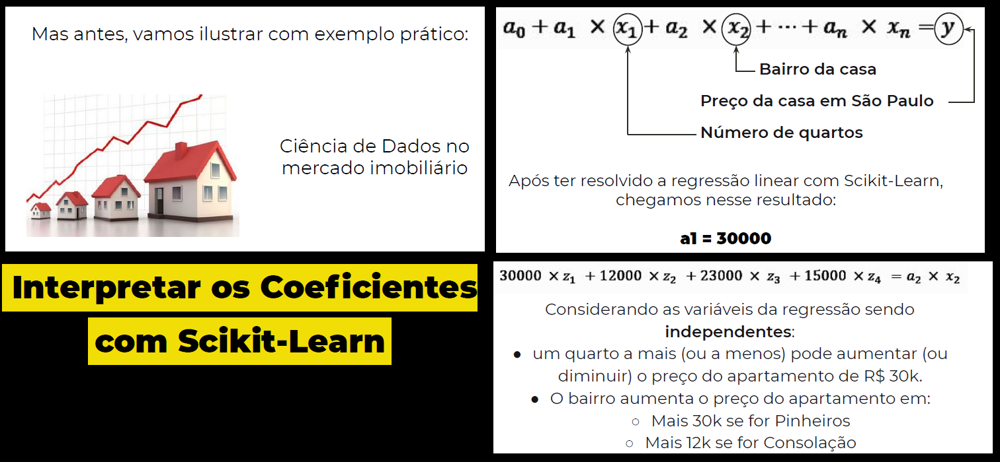

## (i) Importação das Bibliotecas

In [ ]:
# Main Libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Pré-processamento dos dados
from sklearn.preprocessing import MinMaxScaler,StandardScaler #Ref: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.simplefilter("ignore")

## (ii) Criação do DataFrame

In [ ]:
df = pd.read_csv("Consumo_cerveja.csv")
df

,Data,Temperatura Media (C),Temperatura Minima (C),Temperatura Maxima (C),Precipitacao (mm),Final de Semana,Consumo de cerveja (litros)
0,2015-01-01,"27,3","23,9","32,5",0,0.0,25.461
1,2015-01-02,"27,02","24,5","33,5",0,0.0,28.972
2,2015-01-03,"24,82","22,4","29,9",0,1.0,30.814
3,2015-01-04,"23,98","21,5","28,6","1,2",1.0,29.799
4,2015-01-05,"23,82",21,"28,3",0,0.0,28.900
...,...,...,...,...,...,...,...
936,NaN,NaN,NaN,NaN,NaN,NaN,NaN
937,NaN,NaN,NaN,NaN,NaN,NaN,NaN
938,NaN,NaN,NaN,NaN,NaN,NaN,NaN
939,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## (iii) Data Cleaning

In [ ]:
# Renomeando as colunas para padronização e facilitação do código
columns = ['data','temp_med','temp_min','temp_max','precipitacao','fimsemana','consumo']
df.columns = columns
df.head()

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana,consumo
0,2015-01-01,"27,3","23,9","32,5",0,0.0,25.461
1,2015-01-02,"27,02","24,5","33,5",0,0.0,28.972
2,2015-01-03,"24,82","22,4","29,9",0,1.0,30.814
3,2015-01-04,"23,98","21,5","28,6","1,2",1.0,29.799
4,2015-01-05,"23,82",21,"28,3",0,0.0,28.900


In [ ]:
df_clean = df.copy()
df_clean.dropna(axis=0,inplace=True)
df_clean.tail(3)

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana,consumo
362,2015-12-29,"21,68","20,3","24,1","10,3",0.0,22.309
363,2015-12-30,"21,38","19,3","22,4","6,3",0.0,20.467
364,2015-12-31,"24,76","20,2",29,0,0.0,22.446


In [ ]:
# Transformação da data para o formato datetime
df_clean['data'] = pd.to_datetime(df_clean['data'], format="%Y-%m-%d")

# Transformação dos dados para tipo float
df_clean['temp_med']     = df_clean['temp_med'].str.replace(',','.').astype(float)
df_clean['temp_min']     = df_clean['temp_min'].str.replace(',','.').astype(float)
df_clean['temp_max']     = df_clean['temp_max'].str.replace(',','.').astype(float)
df_clean['precipitacao'] = df_clean['precipitacao'].str.replace(',','.').astype(float)

# - Outra forma - Utilizar no começo
# df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/datasets/Portfolio/Consumo_cerveja.csv",decimal=",")

# Transformação dos dados para tipo int
df_clean['fimsemana'] = df_clean['fimsemana'].astype(int)

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 365 entries, 0 to 364
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   data          365 non-null    datetime64[ns]
 1   temp_med      365 non-null    float64       
 2   temp_min      365 non-null    float64       
 3   temp_max      365 non-null    float64       
 4   precipitacao  365 non-null    float64       
 5   fimsemana     365 non-null    int64         
 6   consumo       365 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 22.8 KB


## (iv) Separação: dados de treino e dados de teste

In [ ]:
X = df_clean[['data', 'temp_med', 'temp_min', 'temp_max', 'precipitacao', 'fimsemana']]
y = df_clean[['consumo']]

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=75)

In [ ]:
X_train.head()

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana
227,2015-08-16,20.56,16.2,27.2,0.0,1
7,2015-01-08,24.90,19.5,32.8,48.6,0
339,2015-12-06,23.12,20.6,28.0,0.1,1
354,2015-12-21,23.12,19.6,29.1,27.2,0
191,2015-07-11,17.46,16.0,19.8,0.0,1


### a) Transformação dos dados (normalização)

A coluna **data** é apenas um indíce que nos auxilia a visualizar a evolução do consumo ao longo do tempo, porém ela não é utilizada nos transformadores e nem no treinamento / validação do modelo.

In [ ]:
# Chamar os modelos de transformação
min_max = MinMaxScaler()
norm = StandardScaler()

> Treinar o StandardScaler()

In [ ]:
X_train_norm = X_train.copy()
X_test_norm = X_test.copy()
for i in X_train_norm.columns:
  if i == 'data':
    pass
  else: 
    X_train_norm[i] = norm.fit_transform(X_train_norm[i].values.reshape(-1,1))
    X_test_norm[i] = norm.transform(X_test_norm[i].values.reshape(-1,1))

X_train_norm.head()

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana
227,2015-08-16,-0.278386,-0.512593,0.084390,-0.425067,1.586843
7,2015-01-08,1.116713,0.680485,1.408720,3.231927,-0.630182
339,2015-12-06,0.544529,1.078178,0.273580,-0.417542,1.586843
354,2015-12-21,0.544529,0.716639,0.533717,1.621646,-0.630182
191,2015-07-11,-1.274884,-0.584900,-1.665617,-0.425067,1.586843


> Treinar o MinMaxScaler()

In [ ]:
X_train_min_max = X_train.copy()
X_test_min_max = X_test.copy()
for i in X_train_min_max.columns:
  if i == 'data':
    pass
  else:
    X_train_min_max[i] = min_max.fit_transform(X_train_min_max[i].values.reshape(-1,1))
    X_test_min_max[i] = min_max.transform(X_test_min_max[i].values.reshape(-1,1))

X_train_min_max.head()

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana
227,2015-08-16,0.479950,0.385185,0.596244,0.000000,1.0
7,2015-01-08,0.751880,0.629630,0.859155,0.512658,0.0
339,2015-12-06,0.640351,0.711111,0.633803,0.001055,1.0
354,2015-12-21,0.640351,0.637037,0.685446,0.286920,0.0
191,2015-07-11,0.285714,0.370370,0.248826,0.000000,1.0


## (v) Treinamento e validação dos modelos

> Sem transformação

In [ ]:
# Chamar o modelo
LinReg = LinearRegression()

# Treinar o modelo
LinReg.fit(X_train.iloc[:,1:],y_train,)

# Predizer os valores de teste
y_pred = LinReg.predict(X_test.iloc[:,1:])


# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg.intercept_,LinReg.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

Fórmula: y = [6.16138335] [ 0.05198575 -0.03504732  0.6617024  -0.05541184  5.18728834] x
MSE: 1.9247425150069806
RMSE: 4.955697851338491
R²: 0.7035226802685473


> Dados com MinMaxScaler

In [ ]:
# Chamar o modelo
LinReg_mim_max = LinearRegression()

# Treinar o modelo
LinReg_mim_max.fit(X_train_min_max.iloc[:,1:],y_train)

# Predizer os valores de teste
y_pred = LinReg_mim_max.predict(X_test_min_max.iloc[:,1:])


# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg_mim_max.intercept_,LinReg_mim_max.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

Fórmula: y = [16.04116379] [ 0.82969252 -0.47313884 14.09426118 -5.25304253  5.18728834] x
MSE: 1.9247425150069806
RMSE: 4.955697851338491
R²: 0.7035226802685473


> Dados com StandardScaler()

In [ ]:
# Chamar o modelo
LinReg_norm = LinearRegression()

# Treinar o modelo
LinReg_norm.fit(X_train_norm.iloc[:,1:],y_train,)

# Predizer os valores de teste
y_pred = LinReg_norm.predict(X_test_norm.iloc[:,1:])


# Calcular as métricas do modelo
print("Fórmula: y = {} {} x".format(LinReg_norm.intercept_,LinReg_norm.coef_[0]))
print("MSE: {}".format(metrics.mean_absolute_error(y_test,y_pred)))
print("RMSE: {}".format(metrics.mean_squared_error(y_test,y_pred)))
print("R²: {}".format(metrics.r2_score(y_test,y_pred)))

Fórmula: y = [25.58140068] [ 0.16172206 -0.0969393   2.7980446  -0.73640132  2.33975146] x
MSE: 1.92474251500698
RMSE: 4.955697851338488
R²: 0.7035226802685475


> Análise geral

In [ ]:
# Montar dataframes com as informações gerais e previsões em todos os casos
df = X.copy()
df['consumo_real'] = y
df['consumo_previsto'] = LinReg.predict(X.iloc[:,1:])
df

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana,consumo_real,consumo_previsto
0,2015-01-01,27.30,23.9,32.5,0.0,0,25.461,28.248291
1,2015-01-02,27.02,24.5,33.5,0.0,0,28.972,28.874409
2,2015-01-03,24.82,22.4,29.9,0.0,1,30.814,31.638800
3,2015-01-04,23.98,21.5,28.6,1.2,1,29.799,30.699967
4,2015-01-05,23.82,21.0,28.3,0.0,0,28.900,25.389868
...,...,...,...,...,...,...,...,...
360,2015-12-27,24.00,21.1,28.2,13.6,1,32.307,29.763238
361,2015-12-28,22.64,21.1,26.7,0.0,0,26.095,24.266296
362,2015-12-29,21.68,20.3,24.1,10.3,0,22.309,21.953260
363,2015-12-30,21.38,19.3,22.4,6.3,0,20.467,21.069465


In [ ]:
df_min_max = X.copy()
for i in df_min_max.columns:
  if i == 'data':
    pass
  else:
    min_max.fit(X_train[i].values.reshape(-1,1))
    df_min_max[i] = min_max.transform(df_min_max[i].values.reshape(-1,1))


df_min_max['consumo_real'] = y
df_min_max['consumo_previsto'] = LinReg_mim_max.predict(df_min_max.iloc[:,1:-1])
df_min_max

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana,consumo_real,consumo_previsto
0,2015-01-01,0.902256,0.955556,0.845070,0.000000,0.0,25.461,28.248291
1,2015-01-02,0.884712,1.000000,0.892019,0.000000,0.0,28.972,28.874409
2,2015-01-03,0.746867,0.844444,0.723005,0.000000,1.0,30.814,31.638800
3,2015-01-04,0.694236,0.777778,0.661972,0.012658,1.0,29.799,30.699967
4,2015-01-05,0.684211,0.740741,0.647887,0.000000,0.0,28.900,25.389868
...,...,...,...,...,...,...,...,...
360,2015-12-27,0.695489,0.748148,0.643192,0.143460,1.0,32.307,29.763238
361,2015-12-28,0.610276,0.748148,0.572770,0.000000,0.0,26.095,24.266296
362,2015-12-29,0.550125,0.688889,0.450704,0.108650,0.0,22.309,21.953260
363,2015-12-30,0.531328,0.614815,0.370892,0.066456,0.0,20.467,21.069465


In [ ]:
df_norm = X.copy()
for i in df_norm.columns:
  if i == 'data':
    pass
  else:
    norm.fit(X_train[i].values.reshape(-1,1))
    df_norm[i] = norm.transform(df_norm[i].values.reshape(-1,1))


df_norm['consumo_real'] = y
df_norm['consumo_previsto'] = LinReg_norm.predict(df_norm.iloc[:,1:-1])
df_norm

,data,temp_med,temp_min,temp_max,precipitacao,fimsemana,consumo_real,consumo_previsto
0,2015-01-01,1.888195,2.271256,1.337774,-0.425067,-0.630182,25.461,28.248291
1,2015-01-02,1.798189,2.488180,1.574261,-0.425067,-0.630182,28.972,28.874409
2,2015-01-03,1.090996,1.728948,0.722906,-0.425067,1.586843,30.814,31.638800
3,2015-01-04,0.820977,1.403563,0.415473,-0.334771,1.586843,29.799,30.699967
4,2015-01-05,0.769545,1.222794,0.344527,-0.425067,-0.630182,28.900,25.389868
...,...,...,...,...,...,...,...,...
360,2015-12-27,0.827407,1.258948,0.320878,0.598289,1.586843,32.307,29.763238
361,2015-12-28,0.390233,1.258948,-0.033853,-0.425067,-0.630182,26.095,24.266296
362,2015-12-29,0.081640,0.969716,-0.648721,0.349975,-0.630182,22.309,21.953260
363,2015-12-30,-0.014796,0.608178,-1.050749,0.048988,-0.630182,20.467,21.069465


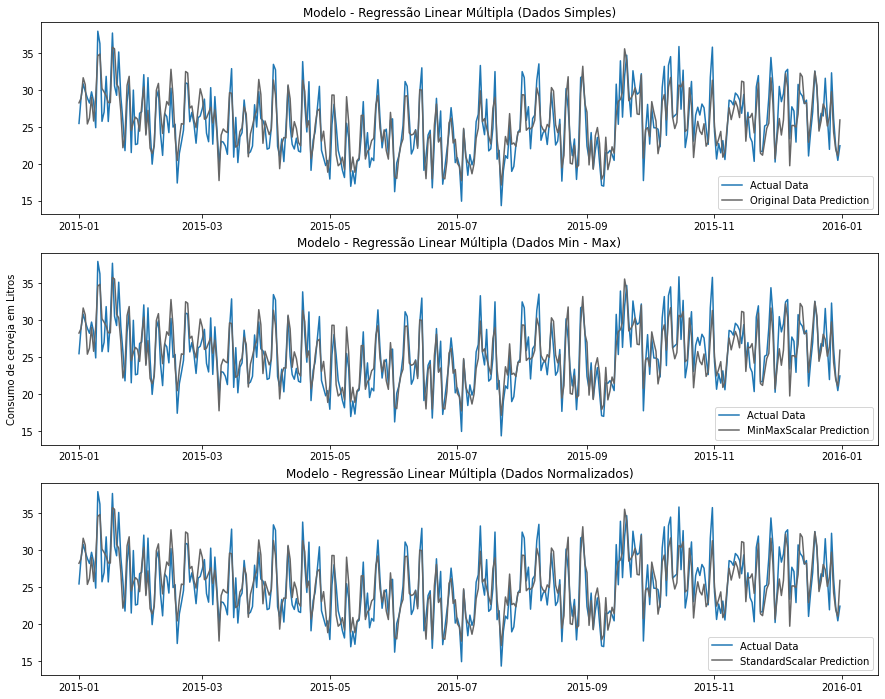

In [ ]:
plt.figure(figsize=(15,12))

color_blue = 'cornflowerblue'
# Visualização do consumo durante todo o ano
plt.subplot(3,1,1)
plt.plot_date(x='data',y='consumo_real',data=df,fmt='-')
plt.plot_date(x='data',y='consumo_previsto',data=df,fmt='-',color='#666666')
plt.title('Modelo - Regressão Linear Múltipla (Dados Simples)')
plt.legend(('Actual Data','Original Data Prediction'))

color_blue = 'cornflowerblue'
# Visualização do consumo durante todo o ano
plt.subplot(3,1,2)
plt.plot_date(x='data',y='consumo_real',data=df_min_max,fmt='-')
plt.plot_date(x='data',y='consumo_previsto',data=df_min_max,fmt='-',color='#666666')
plt.title('Modelo - Regressão Linear Múltipla (Dados Min - Max)')
plt.ylabel('Consumo de cerveja em Litros')
plt.legend(('Actual Data','MinMaxScalar Prediction'))

color_blue = 'cornflowerblue'
# Visualização do consumo durante todo o ano
plt.subplot(3,1,3)
plt.plot_date(x='data',y='consumo_real',data=df_norm,fmt='-')
plt.plot_date(x='data',y='consumo_previsto',data=df_min_max,fmt='-',color='#666666')
plt.title('Modelo - Regressão Linear Múltipla (Dados Normalizados)')
plt.legend(('Actual Data','StandardScalar Prediction'))



plt.show()

# 5- Limites de um Modelo Linear

Conceitos Gerais:

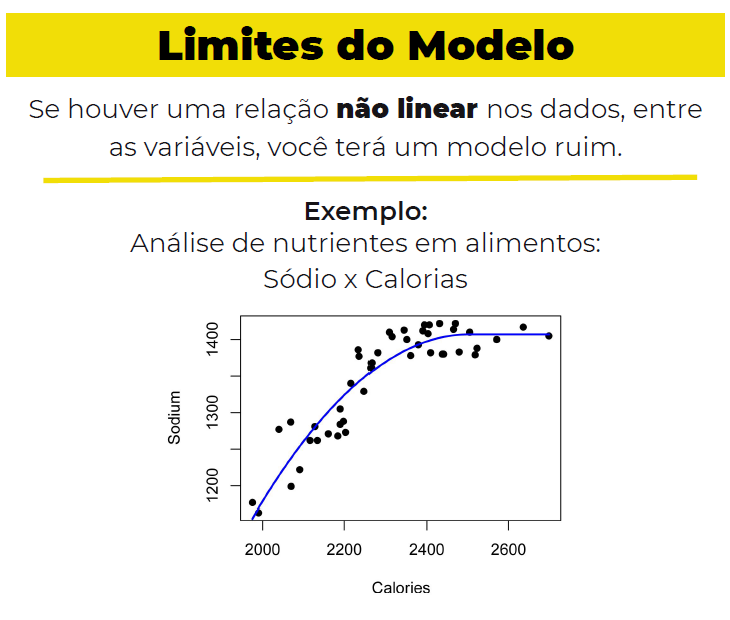

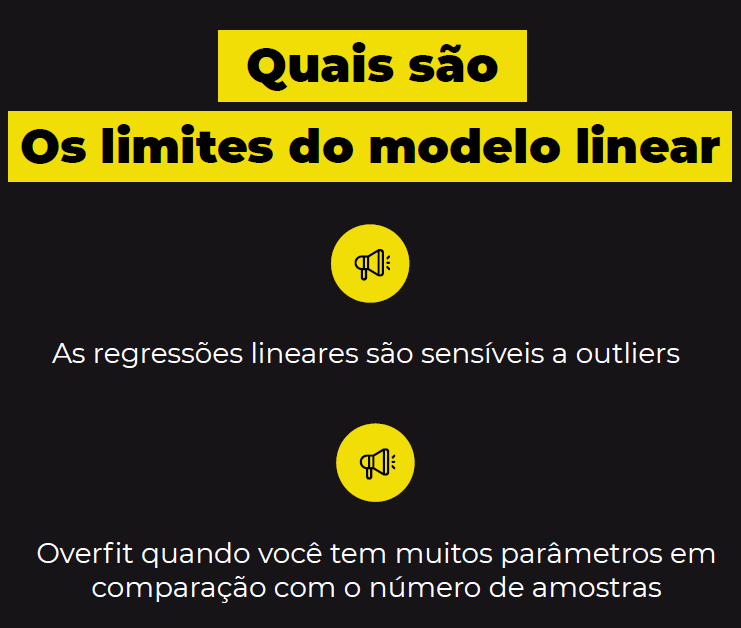

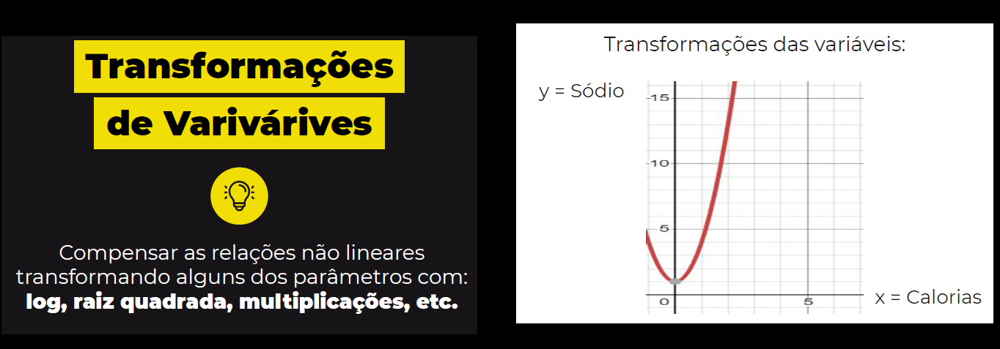

Uma das áreas em que a ciência de dados pode ser aplicada é  na saúde e um tema que está em foco é a pandemia do COVID-19.

A utilização desses dados é ampla e pode ser aplicada, por exemplo, para entender a variação dos óbitos ao longo do tempo como uma forma de prever a tendência futura e auxiliar em políticas públicas.

Sabendo de tudo isso, um epidemiologista te pediu para analisar os dados de óbitos nacionais da semana 25 a 35 e quer saber quando o número de mortes vai ser inferior a 100 óbitos por semana para que se decida sobre a abertura das cidades.

Como sabemos, o comportamento dos casos (óbitos e infecções) é algo exponencial. Uma regressão linear robusta até poderia funcionar, mas o plot dos dados de semana por óbito e semana por ln(óbito) pode nos ajudar a entender se existe alguma diferença. 

Após isso, você deve fazer uma regressão de semana por obito e semana por ln(obito) e através das métricas de R², erro quadrático médio, gráficos dos resíduos, normalidade dos resíduos (teste de Shapiro) e homocedasticidade (teste de Breusch-Pagan), você deve dizer escolher o modelo que vai responder a pergunta do epidemiologista.

## (i) Importação das bibliotecas

In [ ]:
# Main Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## (ii) Criação do DataFrame

Nosso dataset será carregado diretamente por arrays do numpy e foram extraídos com base nos dados de https://covid.saude.gov.br/. Ele corresponde ao número de óbitos por semana, da semana 25 (junho/21) até a semana 35 (setembro/21)

In [ ]:
semana = np.arange(25,36)
obitos = np.array([11935, 10852, 9306, 8373, 8182, 6922, 6382,6032,5421,4801,4352])
df=pd.DataFrame({'Semana':semana, 'Obitos':obitos}) #coloquei num dataframe pra ficar mais facil de plotar os dados
df

,Semana,Obitos
0,25,11935
1,26,10852
2,27,9306
3,28,8373
4,29,8182
5,30,6922
6,31,6382
7,32,6032
8,33,5421
9,34,4801


In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   Semana  11 non-null     int64
 1   Obitos  11 non-null     int64
dtypes: int64(2)
memory usage: 304.0 bytes


## (iii) Exploratory Data Analysis (EDA)

In [ ]:
df.describe()

,Semana,Obitos
count,11.000000,11.000000
mean,30.000000,7505.272727
std,3.316625,2462.711720
min,25.000000,4352.000000
25%,27.500000,5726.500000
50%,30.000000,6922.000000
75%,32.500000,8839.500000
max,35.000000,11935.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f222e1c25d0>,
      dtype=object)

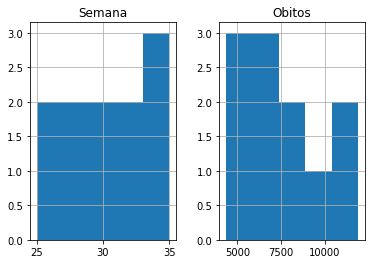

In [ ]:
df.hist(bins=5)

### a) Visualização - Tendência Linear

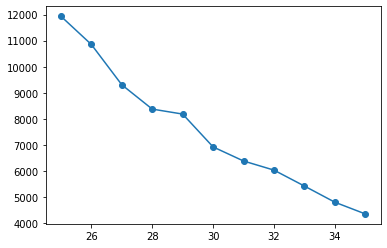

In [ ]:
plt.plot(df.Semana, df.Obitos, '-o')

### b) Visualização - Tendência Logarítmica (Natural)

In [ ]:
df['Obitos_ln']=np.log(df['Obitos'])
df.head(3)

,Semana,Obitos,Obitos_ln
0,25,11935,9.387231
1,26,10852,9.292105
2,27,9306,9.138415


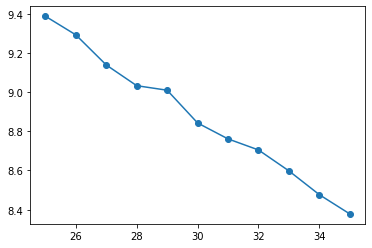

In [ ]:
plt.plot(df.Semana, df.Obitos_ln, '-o')

## (iv) Treinamento e validação dos modelos

Quando se tem poucos dados é aconselhável não fazer o split, isto é, não separar em dados de treino e teste. Entretanto, é aconselhável analisar em conjunto as estatísticas e métricas para que não haja overfitting.

Aqui utilizaremos a biblioteca StatsModels (OLS), pois ela fornece todas as métricas e, principalmente, as estatísticas sem muito esforço, mas qualquer outro método linear poderia ser implementado

### a) Modelo Linear

In [ ]:
X_linear = semana
X_linear = sm.add_constant(X_linear) 
X_linear

array([[ 1., 25.],
       [ 1., 26.],
       [ 1., 27.],
       [ 1., 28.],
       [ 1., 29.],
       [ 1., 30.],
       [ 1., 31.],
       [ 1., 32.],
       [ 1., 33.],
       [ 1., 34.],
       [ 1., 35.]])

In [ ]:
y_linear=df['Obitos']
y_linear

0     11935
1     10852
2      9306
3      8373
4      8182
5      6922
6      6382
7      6032
8      5421
9      4801
10     4352
Name: Obitos, dtype: int64

In [ ]:
linear_model = sm.OLS(y_linear, X_linear)
result_linear = linear_model.fit()

print(result_linear.summary())

                            OLS Regression Results                            
Dep. Variable:                 Obitos   R-squared:                       0.965
Model:                            OLS   Adj. R-squared:                  0.962
Method:                 Least Squares   F-statistic:                     251.6
Date:                Sat, 05 Feb 2022   Prob (F-statistic):           6.94e-08
Time:                        14:02:33   Log-Likelihood:                -82.472
No. Observations:                  11   AIC:                             168.9
Df Residuals:                       9   BIC:                             169.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.939e+04   1387.603     21.183      0.0

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1535: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  "anyway, n=%i" % int(n))


In [ ]:
y_pred_linear = result_linear.predict(X_linear)
y_pred_linear

array([11153.27272727, 10423.67272727,  9694.07272727,  8964.47272727,
        8234.87272727,  7505.27272727,  6775.67272727,  6046.07272727,
        5316.47272727,  4586.87272727,  3857.27272727])

In [ ]:
print('Root Mean Squared Error (RMSE): ',sm.tools.eval_measures.rmse(y_linear, y_pred_linear))
print('Mean Absolute Error (MAE): ',sm.tools.eval_measures.meanabs(y_linear, y_pred_linear))

Root Mean Squared Error (RMSE):  436.38104510728414
Mean Absolute Error (MAE):  367.89752066115597


> Resíduos

In [ ]:
pd.DataFrame({'Obitos_Actual':y_linear,
              'Obitos_Predicted':y_pred_linear,
              'Residuals':y_linear - y_pred_linear})

,Obitos_Actual,Obitos_Predicted,Residuals
0,11935,11153.272727,781.727273
1,10852,10423.672727,428.327273
2,9306,9694.072727,-388.072727
3,8373,8964.472727,-591.472727
4,8182,8234.872727,-52.872727
5,6922,7505.272727,-583.272727
6,6382,6775.672727,-393.672727
7,6032,6046.072727,-14.072727
8,5421,5316.472727,104.527273
9,4801,4586.872727,214.127273


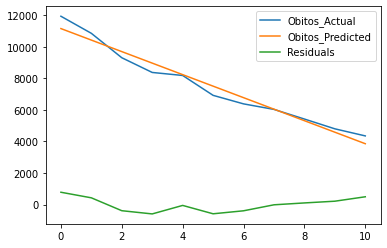

In [ ]:
pd.DataFrame({'Obitos_Actual':y_linear,
              'Obitos_Predicted':y_pred_linear,
              'Residuals':y_linear - y_pred_linear}).plot()

In [ ]:
residuals_linear = result_linear.resid
residuals_linear

0     781.727273
1     428.327273
2    -388.072727
3    -591.472727
4     -52.872727
5    -583.272727
6    -393.672727
7     -14.072727
8     104.527273
9     214.127273
10    494.727273
dtype: float64

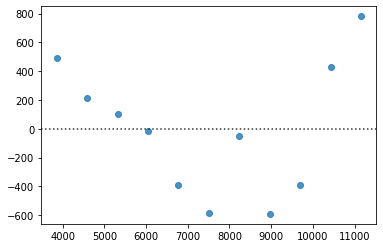

In [ ]:
sns.residplot(y=residuals_linear, x=y_pred_linear)

In [ ]:
#vamos fazer o teste de normalidade dos resíduos

stat, p = sp.stats.shapiro(residuals_linear)
print('Statistics=%.3f, p=%.3f' % (stat, p))

if p > 0.05:
  print('>> O p-value é maior que 5%, então a distribuição é normal!')

Statistics=0.948, p=0.623
>> O p-value é maior que 5%, então a distribuição é normal!


In [ ]:
# aqui tem o teste de homocedasticidade 

sm.stats.het_breuschpagan(residuals_linear,result_linear.model.exog)

#o pvalor está na segunda linha e como é maior que 5%, os resíduos tem variancia inconstante no intervalo

(3.156545059505461,
 0.07562307126980287,
 3.6219887474432197,
 0.0894360907440582)

### b) Modelo Logarítmico (Natural)

Regressão linear de Ln(y) = a*x+b:

Observe que a curva segue `y = a*exp(b*x)` e a equação fica `ln(y) = ln(a)+b*x`

In [ ]:
X_ln = semana
X_ln = sm.add_constant(X_ln) 
X_ln

array([[ 1., 25.],
       [ 1., 26.],
       [ 1., 27.],
       [ 1., 28.],
       [ 1., 29.],
       [ 1., 30.],
       [ 1., 31.],
       [ 1., 32.],
       [ 1., 33.],
       [ 1., 34.],
       [ 1., 35.]])

In [ ]:
y_ln = df.Obitos_ln
y_ln

0     9.387231
1     9.292105
2     9.138415
3     9.032768
4     9.009692
5     8.842460
6     8.761237
7     8.704834
8     8.598036
9     8.476580
10    8.378391
Name: Obitos_ln, dtype: float64

In [ ]:
logn_model = sm.OLS(y_ln, X_ln)
result_logn = logn_model.fit()

print(result_logn.summary())

                            OLS Regression Results                            
Dep. Variable:              Obitos_ln   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     1335.
Date:                Sat, 05 Feb 2022   Prob (F-statistic):           4.27e-11
Time:                        14:02:56   Log-Likelihood:                 24.721
No. Observations:                  11   AIC:                            -45.44
Df Residuals:                       9   BIC:                            -44.65
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.8288      0.081    145.479      0.0

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:1535: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  "anyway, n=%i" % int(n))


In [ ]:
y_pred_logn = result_logn.predict(X_ln)
y_pred_logn

array([9.36705685, 9.26858631, 9.17011578, 9.07164524, 8.97317471,
       8.87470417, 8.77623364, 8.6777631 , 8.57929257, 8.48082203,
       8.38235149])

In [ ]:
print('Root Mean Squared Error (RMSE): ',sm.tools.eval_measures.rmse(np.exp(y_ln), np.exp(y_pred_logn)))
print('Mean Absolute Error (MAE): ',sm.tools.eval_measures.meanabs(np.exp(y_ln), np.exp(y_pred_logn)))

Root Mean Squared Error (RMSE):  214.0723944951227
Mean Absolute Error (MAE):  185.3067389379091


In [ ]:
pd.DataFrame({'Obitos_Actual':y_ln,
              'Obitos_Predicted':y_pred_logn,
              'Residuals':np.exp(y_ln) - np.exp(y_pred_logn)})

,Obitos_Actual,Obitos_Predicted,Residuals
0,9.387231,9.367057,238.360610
1,9.292105,9.268586,252.243453
2,9.138415,9.170116,-299.736751
3,9.032768,9.071645,-331.933752
4,9.009692,8.973175,293.394098
5,8.842460,8.874704,-226.831324
6,8.761237,8.776234,-96.431035
7,8.704834,8.677763,161.100720
8,8.598036,8.579293,100.659601
9,8.476580,8.480822,-20.411612


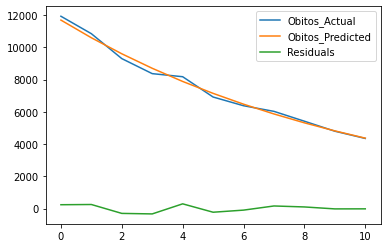

In [ ]:
pd.DataFrame({'Obitos_Actual':np.exp(y_ln),
              'Obitos_Predicted':np.exp(y_pred_logn),
              'Residuals':np.exp(y_ln) - np.exp(y_pred_logn)}).plot()

In [ ]:
residuals_logn = np.exp(y_ln) - np.exp(y_pred_logn)
residuals_logn

0     238.360610
1     252.243453
2    -299.736751
3    -331.933752
4     293.394098
5    -226.831324
6     -96.431035
7     161.100720
8     100.659601
9     -20.411612
10    -17.271172
Name: Obitos_ln, dtype: float64

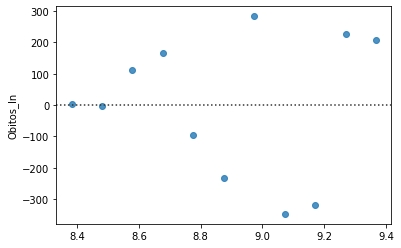

In [ ]:
sns.residplot(y=residuals_logn, x=y_pred_logn)

In [ ]:
#vamos fazer o teste de normalidade dos resíduos

stat, p = sp.stats.shapiro(residuals_logn)
print('Statistics=%.3f, p=%.3f' % (stat, p))

if p > 0.05:
  print('>> O p-value é maior que 5%, então a distribuição é normal!')

Statistics=0.928, p=0.388
>> O p-value é maior que 5%, então a distribuição é normal!


In [ ]:
# aqui tem o teste de homocedasticidade 

sm.stats.het_breuschpagan(residuals_logn,result_logn.model.exog)

#o pvalor está na segunda linha e como é maior que 5%, os resíduos tem variancia inconstante no intervalo

(6.794328498726222,
 0.009144791323019359,
 14.539641641059157,
 0.00413349512514374)

### c) Comparação entre os modelos

Text(0.5, 1.0, 'COVID-19: Óbitos Nacionais da Semana 25 à Semana 35')

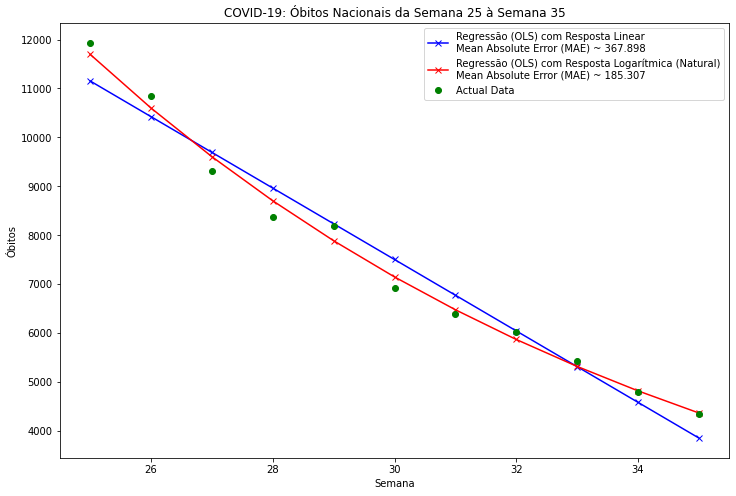

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(df['Semana'], y_pred_linear, '-xb',
         df['Semana'], np.exp(y_pred_logn), '-xr',
         df['Semana'], df['Obitos'],'go')
plt.legend((f'Regressão (OLS) com Resposta Linear\nMean Absolute Error (MAE) ~ 367.898',
            f'Regressão (OLS) com Resposta Logarítmica (Natural)\nMean Absolute Error (MAE) ~ 185.307',
            'Actual Data'))
plt.xlabel('Semana')
plt.ylabel('Óbitos')
plt.title('COVID-19: Óbitos Nacionais da Semana 25 à Semana 35')

O R² do linear é 0.965 e do modelo exponencial é de 0.993. O RMSE linear é 436.38 e do exponencial 214.07. Apesar dos dois modelos terem resíduos normais, apenas o exponencial tem homocedasticidade.

O modelo exponencial tem melhores métricas em comparação ao modelo linear e contextualizando com os dados, e quando ajustado tende a zero no tempo infinito e o linear não, perdendo o sentido físico do dado. 

Respondendo ao epidemiologista:

`y = 100 (número de óbitos)`

`const = 11.8288`

`x1 = -0.0985`

```
ln(y) = x1*semana + const
ln(y=100) = -0.0985*semana + 11.8288
4.6052 = -0.0985*semana + 11.8288
-7.2236 = -0.0985*semana

------------------------------------
>>> semana ~ 73.336
```

Ou seja, temos que a semana com menos de 100 mortes será a partir da semana 73 (daqui a aproximadamente 9 meses).

# 6- Regressão Não-Linear

Conceitos Gerais:

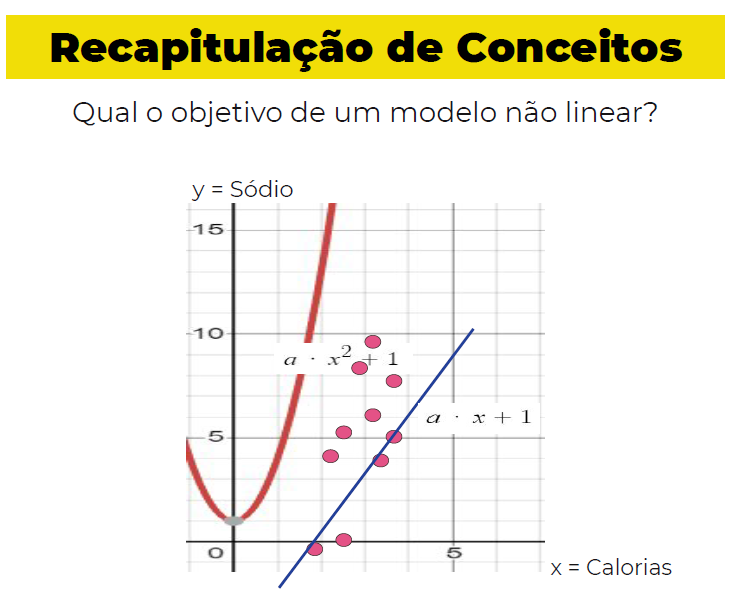

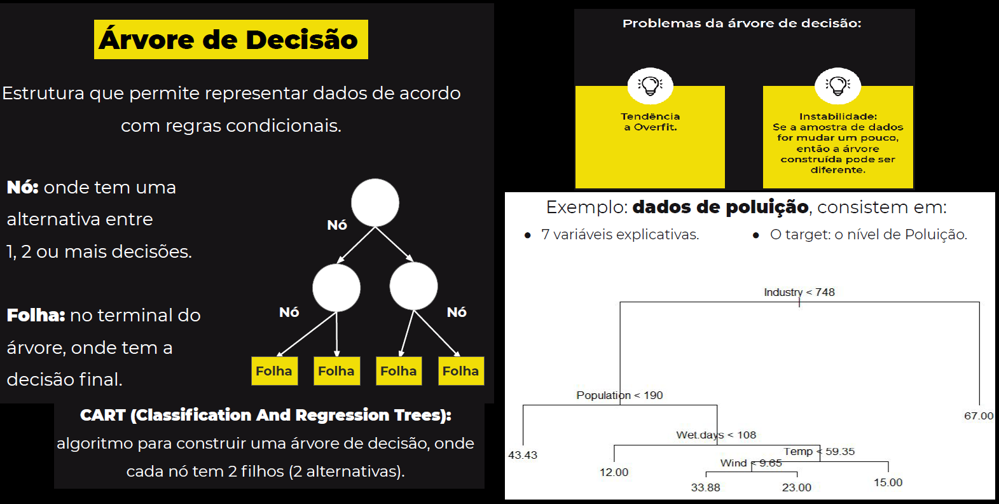

O RH da sua empresa soube que você está estudando ciência de dados e tem alguns dados de anos de experiência e salário na empresa. Eles precisam que você crie um modelo matemático pra facilitar o trabalho deles para na que hora da admissão, eles tenham uma estimativa justa de salário para o contratado conforme a experiência dele.

Aqui você vai precisar escolher qual é o melhor polinômio para ajustar os dados sem ter o perigo que criar um modelo muito complexo que possa ter overfitting. Os passos são os mesmos: plotar os dados, fazer a regressão com polinomios de até 4º grau, comparar resíduos, R² e RMSE. Você pode fazer um split 70/30 dos dados.

## (i) Importação das bibliotecas

In [ ]:
# Main Libraries

from yellowbrick.regressor import ResidualsPlot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

## (ii) Criação do DataFrame

In [ ]:
url = "https://s3.us-west-2.amazonaws.com/public.gamelab.fun/dataset/position_salaries.csv"
df = pd.read_csv(url)
df

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
df.isna().sum()

Position    0
Level       0
Salary      0
dtype: int64

In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Position  10 non-null     object
 1   Level     10 non-null     int64 
 2   Salary    10 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 368.0+ bytes


## (iii) Exploratory Data Analysis (EDA)

In [ ]:
df.describe()

,Level,Salary
count,10.00000,10.000000
mean,5.50000,249500.000000
std,3.02765,299373.883668
min,1.00000,45000.000000
25%,3.25000,65000.000000
50%,5.50000,130000.000000
75%,7.75000,275000.000000
max,10.00000,1000000.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f222a9c4ad0>,
      dtype=object)

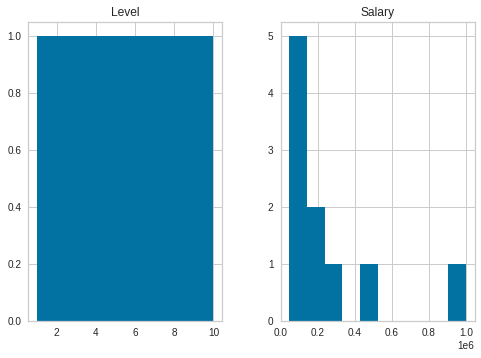

In [ ]:
df.hist()

In [ ]:
df.Position.value_counts()

Business Analyst     1
Junior Consultant    1
Senior Consultant    1
Manager              1
Country Manager      1
Region Manager       1
Partner              1
Senior Partner       1
C-level              1
CEO                  1
Name: Position, dtype: int64

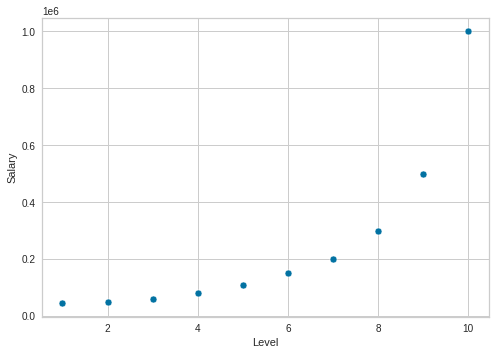

In [ ]:
sns.scatterplot(data=df,x='Level',y='Salary')

## (iv) Separação: Features (X) e Target (y)

In [ ]:
X=df['Level'].values.reshape(-1,1) #anos de experiencia
y=df['Salary'].values.reshape(-1,1) #salário

print(X,'\n\n',y)

[[ 1]
 [ 2]
 [ 3]
 [ 4]
 [ 5]
 [ 6]
 [ 7]
 [ 8]
 [ 9]
 [10]] 

 [[  45000]
 [  50000]
 [  60000]
 [  80000]
 [ 110000]
 [ 150000]
 [ 200000]
 [ 300000]
 [ 500000]
 [1000000]]


## (v) Treinamento e validação dos modelos

### a) Regressão Linear

> Dados de treino e teste

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7, 1)
(7, 1)
(3, 1)
(3, 1)


> Ajuste e Predição

In [ ]:
poly_1 = LinearRegression()
poly_1.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred_teste_1=poly_1.predict(X_test)
y_pred_treino_1=poly_1.predict(X_train)

print(y_pred_teste_1,'\n\n', y_pred_treino_1)

[[227804.62184874]
 [-25210.08403361]
 [312142.85714286]] 

 [[-109548.31932773]
 [ 480819.32773109]
 [  59128.1512605 ]
 [ 143466.38655462]
 [ 396481.09243697]
 [ 649495.79831933]
 [ 565157.56302521]]


> Métricas

In [ ]:
print('RMSE treino: %.2f'% mean_squared_error(y_train, y_pred_treino_1))
print('RMSE teste: %.2f'% mean_squared_error(y_test, y_pred_teste_1))
print('R2 treino: %.2f'% r2_score(y_train, y_pred_treino_1))
print('R2 teste: %.2f'% r2_score(y_test, y_pred_teste_1))

RMSE treino: 32330439675.87
RMSE teste: 15274930597.24
R2 treino: 0.68
R2 teste: -8.04


> Resíduos

-8.044366800996718

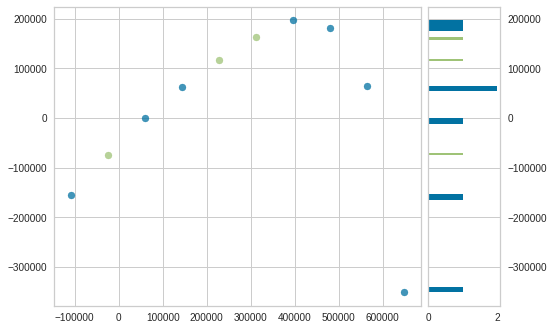

In [ ]:
visualizer = ResidualsPlot(poly_1)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data

> Comparação entre dados originais e dados previstos

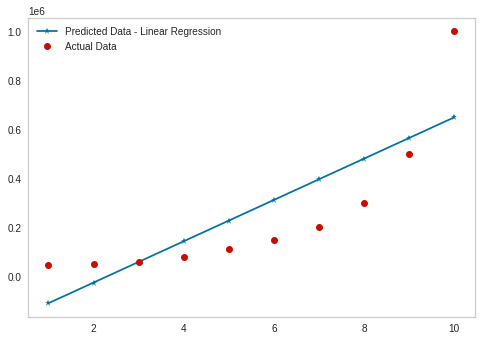

In [ ]:
plt.plot(X, poly_1.predict(X), '-*b', X, y,'ro')
plt.legend(('Predicted Data - Linear Regression','Actual Data'))
plt.grid(False)

### b) Regressão Quadrática

> Dados de treino e teste

In [ ]:
X

array([[ 1],
       [ 2],
       [ 3],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 8],
       [ 9],
       [10]])

In [ ]:
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
X_poly

array([[  1.,   1.,   1.],
       [  1.,   2.,   4.],
       [  1.,   3.,   9.],
       [  1.,   4.,  16.],
       [  1.,   5.,  25.],
       [  1.,   6.,  36.],
       [  1.,   7.,  49.],
       [  1.,   8.,  64.],
       [  1.,   9.,  81.],
       [  1.,  10., 100.]])

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.3, random_state=2)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7, 3)
(7, 1)
(3, 3)
(3, 1)


> Ajuste e Predição

In [ ]:
poly_2 = LinearRegression()
poly_2.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred_teste_2=poly_2.predict(X_test)
y_pred_treino_2=poly_2.predict(X_train)

print(y_pred_teste_2,'\n\n', y_pred_treino_2)

[[ 23433.32715133]
 [ 33488.50148368]
 [105266.13501484]] 

 [[122024.75890207]
 [396708.54970326]
 [-12455.48961425]
 [-15807.21439169]
 [229691.20919881]
 [858520.02967359]
 [606318.15652819]]


> Métricas

In [ ]:
print('RMSE treino: %.2f'% mean_squared_error(y_train, y_pred_treino_2))
print('RMSE teste: %.2f'% mean_squared_error(y_test, y_pred_teste_2))
print('R2 treino: %.2f'% r2_score(y_train, y_pred_treino_2))
print('R2 teste: %.2f'% r2_score(y_test, y_pred_teste_2))

RMSE treino: 8845125384.17
RMSE teste: 3255845702.62
R2 treino: 0.91
R2 teste: -0.93


> Resíduos

-0.9278033765499891

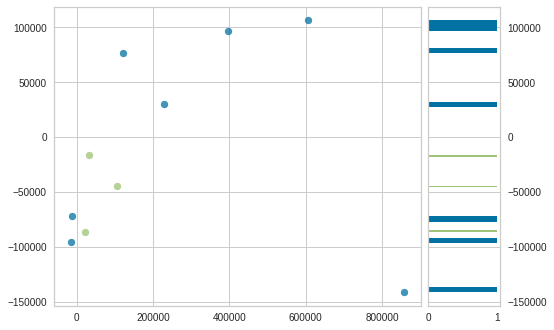

In [ ]:
visualizer = ResidualsPlot(poly_2)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data

> Comparação entre dados originais e dados previstos

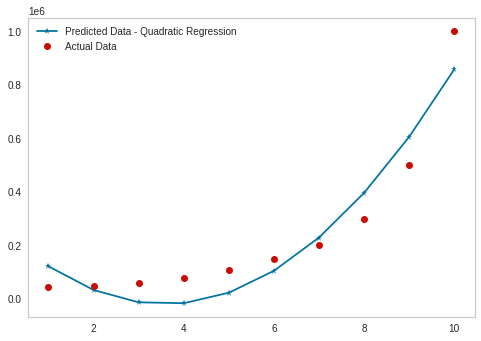

In [ ]:
plt.plot(X, poly_2.predict(X_poly), '-*b', X, y,'ro')
plt.legend(('Predicted Data - Quadratic Regression','Actual Data'))
plt.grid(False)

### c) Regressão Cúbica

> Dados de treino e teste

In [ ]:
poly = PolynomialFeatures(degree=3)
X_poly = poly.fit_transform(X)
X_poly

array([[   1.,    1.,    1.,    1.],
       [   1.,    2.,    4.,    8.],
       [   1.,    3.,    9.,   27.],
       [   1.,    4.,   16.,   64.],
       [   1.,    5.,   25.,  125.],
       [   1.,    6.,   36.,  216.],
       [   1.,    7.,   49.,  343.],
       [   1.,    8.,   64.,  512.],
       [   1.,    9.,   81.,  729.],
       [   1.,   10.,  100., 1000.]])

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.3, random_state=2)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7, 4)
(7, 1)
(3, 4)
(3, 1)


> Ajuste e Predição

In [ ]:
poly_3 = LinearRegression()
poly_3.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred_teste_3=poly_3.predict(X_test)
y_pred_treino_3=poly_3.predict(X_train)

print(y_pred_teste_3,'\n\n', y_pred_treino_3)

[[59136.549515  ]
 [85487.820153  ]
 [76910.64246316]] 

 [[ 35462.13716767]
 [305956.72454664]
 [ 89035.32526757]
 [ 71714.83941902]
 [150647.30517116]
 [963734.58093067]
 [568449.08749726]]


> Métricas

In [ ]:
print('RMSE treino: %.2f'% mean_squared_error(y_train, y_pred_treino_3))
print('RMSE teste: %.2f'% mean_squared_error(y_test, y_pred_teste_3))
print('R2 treino: %.2f'% r2_score(y_train, y_pred_treino_3))
print('R2 teste: %.2f'% r2_score(y_test, y_pred_teste_3))

RMSE treino: 1353470582.90
RMSE teste: 3062843386.53
R2 treino: 0.99
R2 teste: -0.81


> Resíduos

-0.8135256893946072

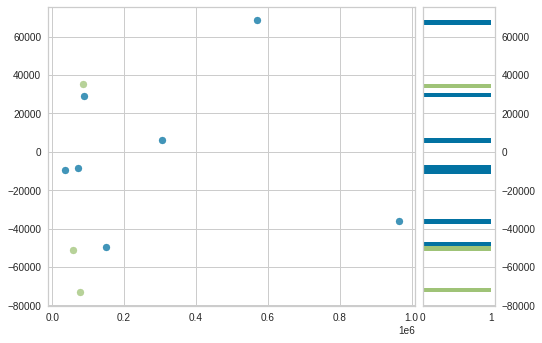

In [ ]:
visualizer = ResidualsPlot(poly_3)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data

> Comparação entre dados originais e dados previstos

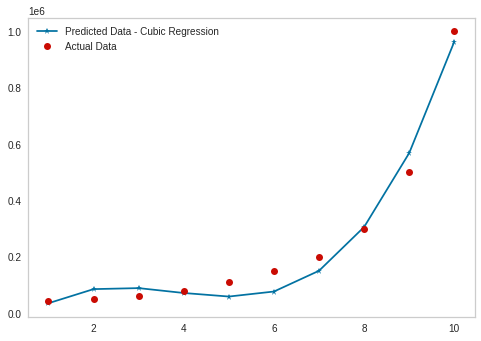

In [ ]:
plt.plot(X, poly_3.predict(X_poly), '-*b', X, y,'ro')
plt.legend(('Predicted Data - Cubic Regression','Actual Data'))
plt.grid(False)

### d) Regressão Quadrática

> Dados de treino e teste

In [ ]:
poly = PolynomialFeatures(degree=4)
X_poly = poly.fit_transform(X)
X_poly

array([[1.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 1.000e+00],
       [1.000e+00, 2.000e+00, 4.000e+00, 8.000e+00, 1.600e+01],
       [1.000e+00, 3.000e+00, 9.000e+00, 2.700e+01, 8.100e+01],
       [1.000e+00, 4.000e+00, 1.600e+01, 6.400e+01, 2.560e+02],
       [1.000e+00, 5.000e+00, 2.500e+01, 1.250e+02, 6.250e+02],
       [1.000e+00, 6.000e+00, 3.600e+01, 2.160e+02, 1.296e+03],
       [1.000e+00, 7.000e+00, 4.900e+01, 3.430e+02, 2.401e+03],
       [1.000e+00, 8.000e+00, 6.400e+01, 5.120e+02, 4.096e+03],
       [1.000e+00, 9.000e+00, 8.100e+01, 7.290e+02, 6.561e+03],
       [1.000e+00, 1.000e+01, 1.000e+02, 1.000e+03, 1.000e+04]])

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.3, random_state=2)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(7, 5)
(7, 1)
(3, 5)
(3, 1)


> Ajuste e Predição

In [ ]:
poly_4 = LinearRegression()
poly_4.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred_teste_4=poly_4.predict(X_test)
y_pred_treino_4=poly_4.predict(X_train)

print(y_pred_teste_4,'\n\n', y_pred_treino_4)

[[137595.33358304]
 [  9360.90542903]
 [161836.51880143]] 

 [[ 46996.86227254]
 [287771.72841368]
 [ 45177.93254683]
 [ 97811.18097095]
 [194812.31058109]
 [993494.74788744]
 [518935.23732747]]


> Métricas

In [ ]:
print('RMSE treino: %.2f'% mean_squared_error(y_train, y_pred_treino_4))
print('RMSE teste: %.2f'% mean_squared_error(y_test, y_pred_teste_4))
print('R2 treino: %.2f'% r2_score(y_train, y_pred_treino_4))
print('R2 teste: %.2f'% r2_score(y_test, y_pred_teste_4))

RMSE treino: 159746225.04
RMSE teste: 851047206.81
R2 treino: 1.00
R2 teste: 0.50


> Resíduos

0.49609046964926695

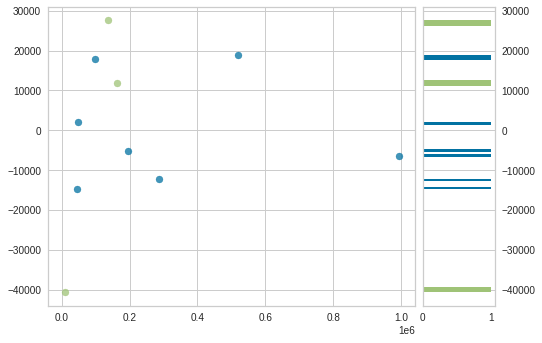

In [ ]:
visualizer = ResidualsPlot(poly_4)

visualizer.fit(X_train, y_train)  # Fit the training data to the visualizer
visualizer.score(X_test, y_test)  # Evaluate the model on the test data

> Comparação entre dados originais e dados previstos

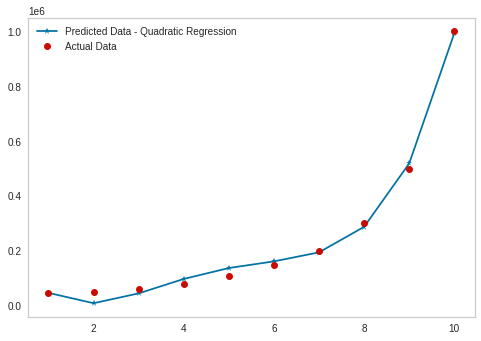

In [ ]:
plt.plot(X, poly_4.predict(X_poly), '-*b', X, y,'ro')
plt.legend(('Predicted Data - Quadratic Regression','Actual Data'))
plt.grid(False)

Conclusão:

Podemos perceber que, aparentemente, o polinômeio de quarto grau é o que melhor representa o salário de acordo com o nível de experiência. Evidentemente a quantidade baixa de pontos nos limita a ter uma certa robustez do modelo e, além disso, o grau do polinômio segue uma curva ótima (isto é, existe um grau para o qual as métricas serão as maiores possíveis e, passando disso, o modelo começará a perder resolução novamente)

# 7- Remoção de Outliers

Conceitos Gerais:

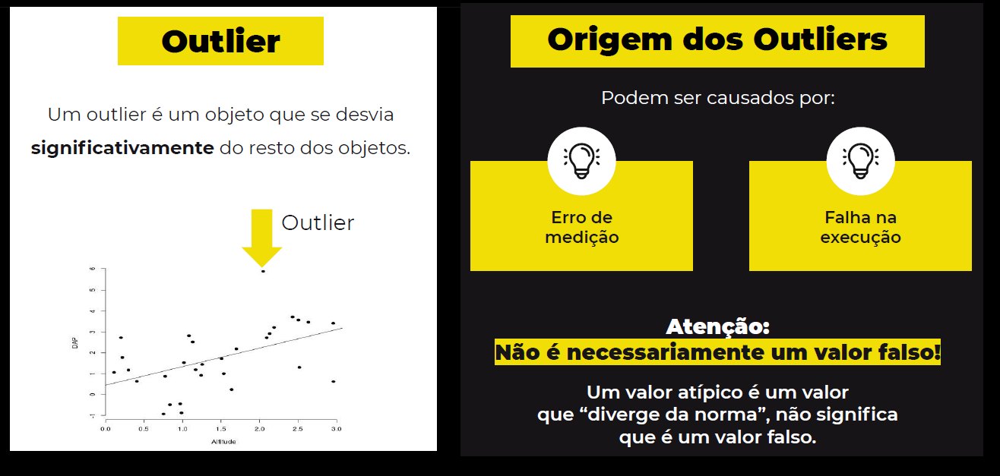

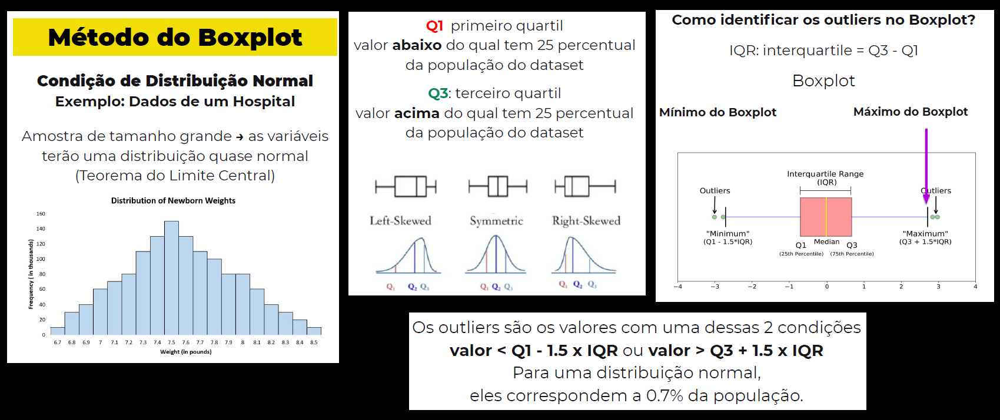

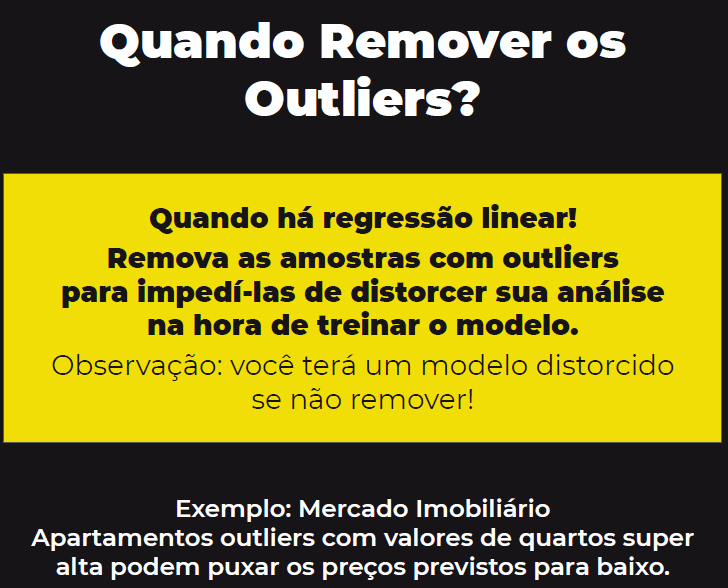

Uma arquiteta está começando a construir um shopping e tem alguns dados de prédios que ela construiu. Sabendo que você é expert em ciência de dados, ela te pediu para extrair alguma informação em relação a quantidade de potência do ar condicionado que ela vai precisar colocar no shopping, sabendo de informações como área de superficie, area do teto, altura e etc.

Como são dados coletados a mão, você deve se atentar a outliers que podem aparecer nos dados. Para fazer isso, você pode fazer o split 80/20 dos dados, realizar a regressão, calcular o R² dos dados. Após tudo isso, observe o gráfico dos resíduos para ver se tem algum valor muito diferente na distribuição e retirando-os dos dados, realize a regressão novamente e compare os valores dos coeficientes regressivos, RMSE e R².

## (i) Importação das Bibliotecas

In [ ]:
# Main Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from yellowbrick.datasets import load_energy #https://www.scikit-yb.org/en/latest/api/datasets/energy.html
from yellowbrick.regressor import ResidualsPlot
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import mean_squared_error

## (ii) Criação do DataFrame

Database: http://archive.ics.uci.edu/ml/datasets/Energy+efficiency

Attribute Information:

The dataset contains eight attributes (or features, denoted by X1...X8) and two responses (or outcomes, denoted by y1 and y2). The aim is to use the eight features to predict each of the two responses.

Specifically:

- X1 Relative Compactness
- X2 Surface Area
- X3 Wall Area
- X4 Roof Area
- X5 Overall Height
- X6 Orientation
- X7 Glazing Area
- X8 Glazing Area Distribution
- y1 Heating Load
- y2 Cooling Load



In [ ]:
df = pd.read_excel('ENB2012_data.xlsx')
df

,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28
...,...,...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5,17.88,21.40
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5,16.54,16.88
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5,16.44,17.11
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5,16.48,16.61


In [ ]:
col_names = ('relative_compactness',
             'surface_area',
             'wall_area',
             'roof_area',
             'overall_height',
             'orientation',
             'glazing_area',
             'glazing_area_distribution',
             'heating_load',
             'cooling_load')

df = df.copy()
df.columns = col_names
df.head()

,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28


In [ ]:
df.isna().sum()

relative_compactness         0
surface_area                 0
wall_area                    0
roof_area                    0
overall_height               0
orientation                  0
glazing_area                 0
glazing_area_distribution    0
heating_load                 0
cooling_load                 0
dtype: int64

In [ ]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   relative_compactness       768 non-null    float64
 1   surface_area               768 non-null    float64
 2   wall_area                  768 non-null    float64
 3   roof_area                  768 non-null    float64
 4   overall_height             768 non-null    float64
 5   orientation                768 non-null    int64  
 6   glazing_area               768 non-null    float64
 7   glazing_area_distribution  768 non-null    int64  
 8   heating_load               768 non-null    float64
 9   cooling_load               768 non-null    float64
dtypes: float64(8), int64(2)
memory usage: 60.1 KB


## (iii) Exploratory Data Analysis (EDA)

### a) Distribuição geral

In [ ]:
df.describe(percentiles=(.001,.01,.1,.25,.5,.75,.9,.99,.999))

,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load
count,768.000000,768.000000,768.000000,768.000000,768.00000,768.000000,768.000000,768.00000,768.000000,768.000000
mean,0.764167,671.708333,318.500000,176.604167,5.25000,3.500000,0.234375,2.81250,22.307195,24.587760
std,0.105777,88.086116,43.626481,45.165950,1.75114,1.118763,0.133221,1.55096,10.090204,9.513306
min,0.620000,514.500000,245.000000,110.250000,3.50000,2.000000,0.000000,0.00000,6.010000,10.900000
0.1%,0.620000,514.500000,245.000000,110.250000,3.50000,2.000000,0.000000,0.00000,6.033010,10.930680
1%,0.620000,514.500000,245.000000,110.250000,3.50000,2.000000,0.000000,0.00000,6.647900,11.726700
10%,0.640000,563.500000,269.500000,122.500000,3.50000,2.000000,0.100000,1.00000,11.217000,14.237000
25%,0.682500,606.375000,294.000000,140.875000,3.50000,2.750000,0.100000,1.75000,12.992500,15.620000
50%,0.750000,673.750000,318.500000,183.750000,5.25000,3.500000,0.250000,3.00000,18.950000,22.080000
75%,0.830000,741.125000,343.000000,220.500000,7.00000,4.250000,0.400000,4.00000,31.667500,33.132500


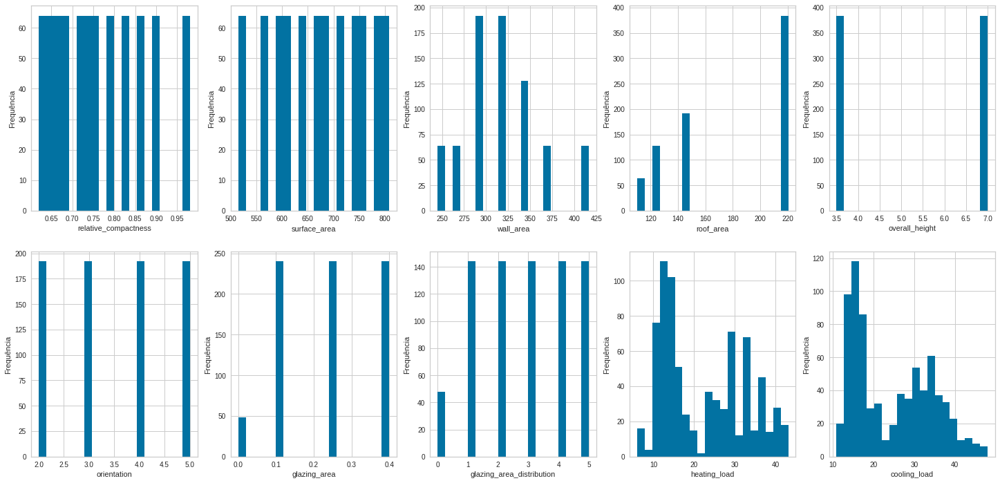

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 5 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):

      ax.hist(df.select_dtypes(include='number')[contColNames[counter]], bins=20)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

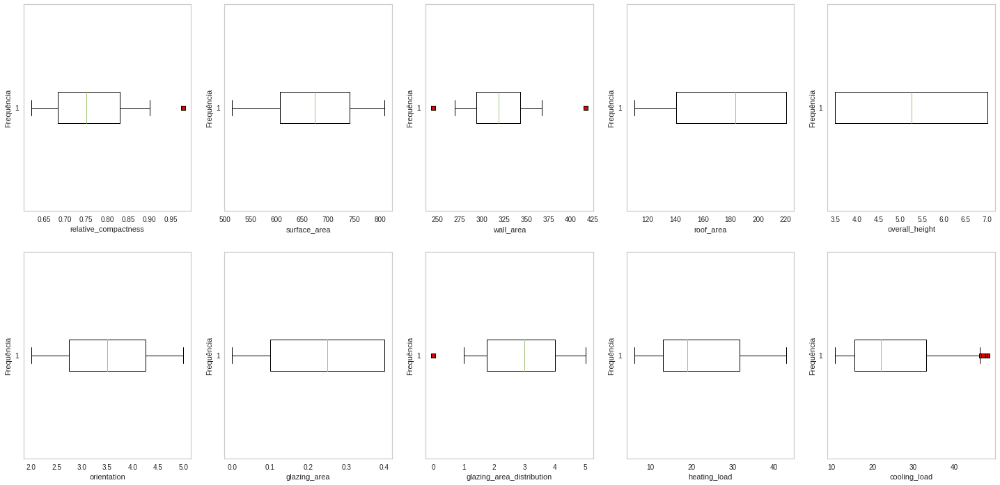

In [ ]:
contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 5 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):
      red_square = dict(markerfacecolor='r', marker='s')
      ax.boxplot(df.select_dtypes(include='number')[contColNames[counter]], flierprops=red_square, vert=False, whis=0.75)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')
      ax.grid(False)
    else:
      ax.set_axis_off()

    counter += 1

plt.show()

### b) Correlação Numérica

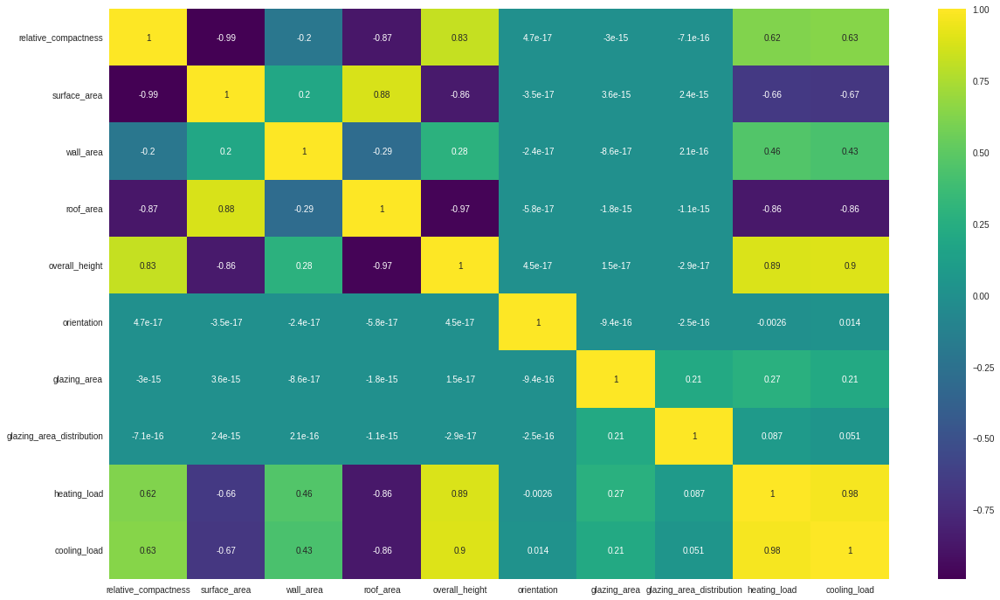

In [ ]:
import seaborn as sns
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(), annot=True, cmap='viridis')

## (iv) Separação: Features (X) e Target (y)

In [ ]:
df.columns

Index(['relative_compactness', 'surface_area', 'wall_area', 'roof_area',
       'overall_height', 'orientation', 'glazing_area',
       'glazing_area_distribution', 'heating_load', 'cooling_load'],
      dtype='object')

In [ ]:
X = df.drop(['heating_load','cooling_load'], axis=1)
y = df[['heating_load','cooling_load']]

print(X.head(),'\n\n',y.head())

   relative_compactness  surface_area  ...  glazing_area  glazing_area_distribution
0                  0.98         514.5  ...           0.0                          0
1                  0.98         514.5  ...           0.0                          0
2                  0.98         514.5  ...           0.0                          0
3                  0.98         514.5  ...           0.0                          0
4                  0.90         563.5  ...           0.0                          0

[5 rows x 8 columns] 

    heating_load  cooling_load
0         15.55         21.33
1         15.55         21.33
2         15.55         21.33
3         15.55         21.33
4         20.84         28.28


## (v) Treinamento e validação dos modelos

### a) Modelo com outliers

> Split em treino e teste

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(576, 8)
(576, 2)
(192, 8)
(192, 2)


> Ajuste do modelo

In [ ]:
model1 = LinearRegression()
model1.fit(X_train, y_train)

LinearRegression()

> Valor dos coeficientes da regressão

In [ ]:
coef1=pd.DataFrame(model1.coef_,columns=features)
coef1.head(1)

,relative compactness,surface area,wall area,roof area,overall height,orientation,glazing area,glazing area distribution
0,-63.968544,-2.164202e+12,2.164202e+12,4.328404e+12,4.032282,-0.046469,19.640658,0.237917


> Predição

In [ ]:
y_pred1=model1.predict(X)
y_pred1

array([[22.51933392, 25.46756469],
       [22.4728649 , 25.52498778],
       [22.42639589, 25.58241086],
       ...,
       [18.9401507 , 19.18548165],
       [18.89368169, 19.24290473],
       [18.84721267, 19.30032782]])

> Métricas

In [ ]:
print('R² dados de treino: ',model1.score(X_train, y_train))
print('R² dados de teste: ',model1.score(X_test, y_test))

R² dados de treino:  0.9001377911815887
R² dados de teste:  0.9005922784722074


In [ ]:
print('MSE (y, y_pred): ',mean_squared_error(y,y_pred1))

MSE (y, y_pred):  9.471044916840452


> Comparação: Valores reais x Valores previstos

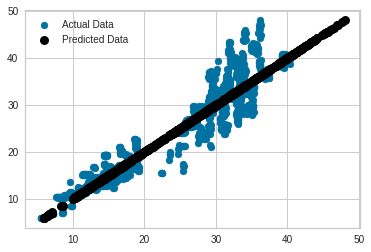

In [ ]:
plt.scatter(y_pred1, y)
plt.scatter(y,y, color='black', lw=2)
plt.legend(('Actual Data', 'Predicted Data'))

> Boxplot dos resíduos

>> Para a variável 'heating_load'

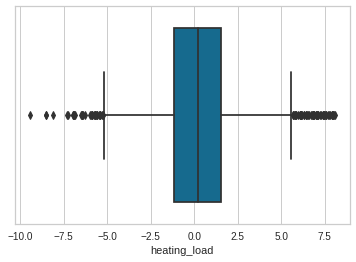

In [ ]:
sns.boxplot(x=(y.heating_load-y_pred1[:,0]))

>> Para a variável 'cooling_load'

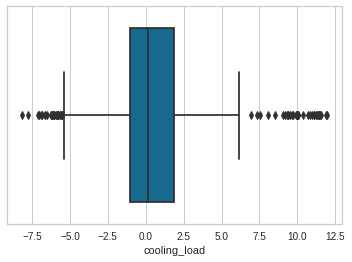

In [ ]:
sns.boxplot(x=(y.cooling_load-y_pred1[:,1]))

### b) Modelo sem outliers

> Estabelecer critério para outliers

In [ ]:
df2=df[df['cooling_load']<39]
df2 = df2[df2['heating_load']<39]
df2

,relative_compactness,surface_area,wall_area,roof_area,overall_height,orientation,glazing_area,glazing_area_distribution,heating_load,cooling_load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28
...,...,...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5,17.88,21.40
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5,16.54,16.88
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5,16.44,17.11
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5,16.48,16.61


In [ ]:
X = df2.drop(['heating_load','cooling_load'], axis=1)
y = df2[['heating_load','cooling_load']]

print(X.head(),'\n\n',y.head())

   relative_compactness  surface_area  ...  glazing_area  glazing_area_distribution
0                  0.98         514.5  ...           0.0                          0
1                  0.98         514.5  ...           0.0                          0
2                  0.98         514.5  ...           0.0                          0
3                  0.98         514.5  ...           0.0                          0
4                  0.90         563.5  ...           0.0                          0

[5 rows x 8 columns] 

    heating_load  cooling_load
0         15.55         21.33
1         15.55         21.33
2         15.55         21.33
3         15.55         21.33
4         20.84         28.28


> Split em treino e teste

In [ ]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(519, 8)
(519, 2)
(173, 8)
(173, 2)


> Ajuste do modelo

In [ ]:
model2 = LinearRegression()
model2.fit(X_train, y_train)

LinearRegression()

> Valor dos coeficientes da regressão

In [ ]:
coef2=pd.DataFrame(model2.coef_,columns=features)
coef2.head(1)

,relative compactness,surface area,wall area,roof area,overall height,orientation,glazing area,glazing area distribution
0,-42.236064,1.714876e+12,-1.714876e+12,-3.429753e+12,2.405365,0.020904,18.684866,0.267338


> Predição


In [ ]:
y_pred2=model2.predict(X)
y_pred2

array([[23.34503751, 26.30357607],
       [23.36594193, 26.42756673],
       [23.38684635, 26.55155738],
       ...,
       [19.22703764, 19.85320644],
       [19.24794206, 19.97719709],
       [19.26884649, 20.10118775]])

> Métricas

In [ ]:
print('R² dados de treino: ',model2.score(X_train, y_train))
print('R² dados de teste: ',model2.score(X_test, y_test))

R² dados de treino:  0.9257613508848221
R² dados de teste:  0.916808657133063


In [ ]:
print('MSE (y, y_pred): ',mean_squared_error(y,y_pred2))

MSE (y, y_pred):  5.445685768332332


> Comparação: Valores reais x Valores previstos

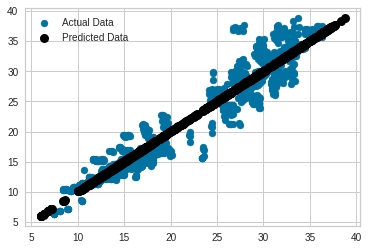

In [ ]:
plt.scatter(y_pred2, y)
plt.scatter(y,y, color='black', lw=2)
plt.legend(('Actual Data', 'Predicted Data'))

> Boxplot dos resíduos

>> Para a variável 'heating_load'

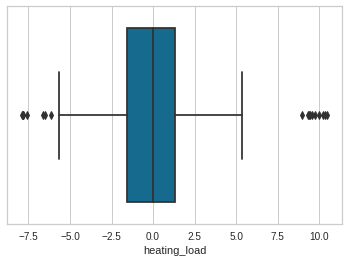

In [ ]:
sns.boxplot(x=(y.heating_load-y_pred2[:,0]))

>> Para a variável 'cooling_load'

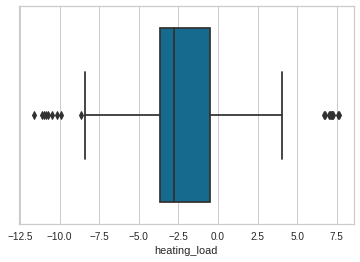

In [ ]:
sns.boxplot(x=(y.heating_load-y_pred2[:,1]))

Ao comparar os modelos, temos que ao retirar os outliers, o RMSE caiu quase pela metade, o R² aumentou em ~2% e os gráficos dos resíduos ficaram mais simétricos e bem distribuídos. Observe que os coeficientes regressivos também mudam bastante, principalmente nas áreas de parede, teto e superfície. É claro que o modelo não está perfeito para ser utilizado, mas já conseguimos observar o processo e a consequência de retirar outliers de um modelo.

# 8- Otimização de Hiperparâmetros

Conceitos Gerais:

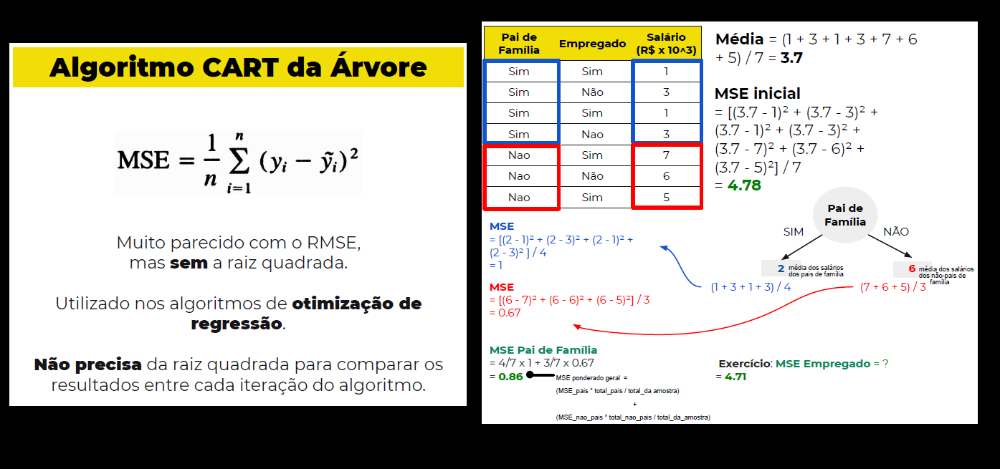

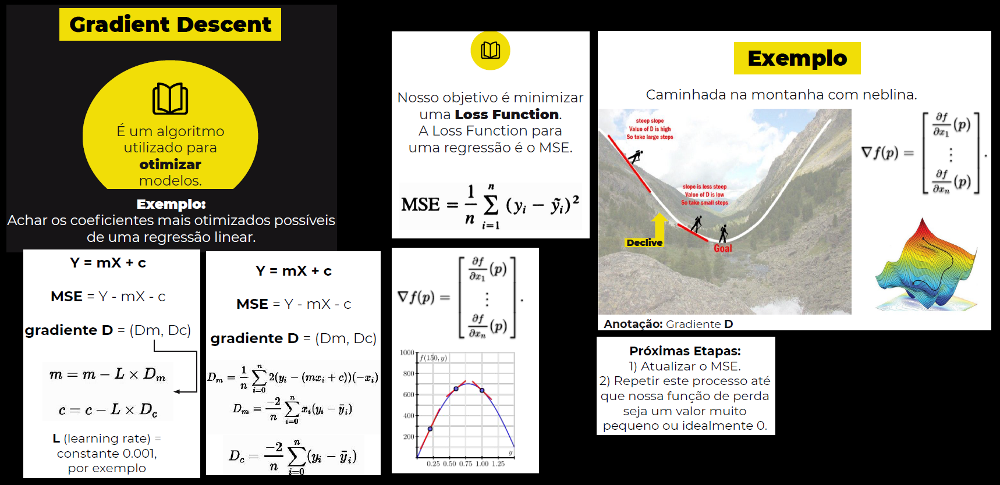

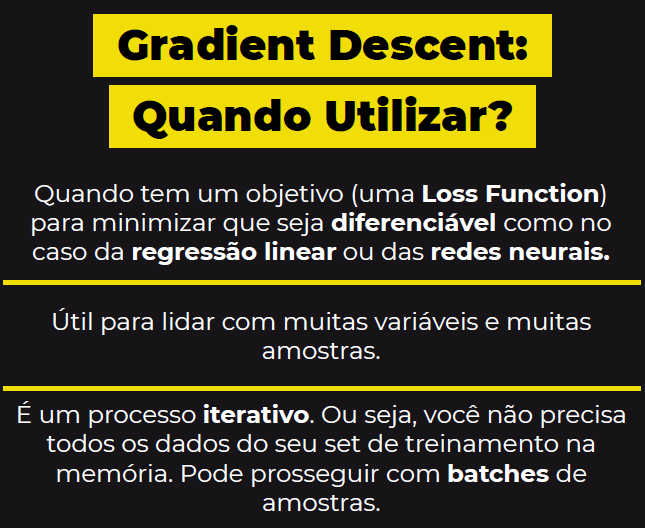

## (i) Importação das Bilbiotecas

In [1]:
# Main Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LassoCV
from yellowbrick.datasets import load_concrete
from sklearn.linear_model import LinearRegression
from yellowbrick.regressor import ResidualsPlot
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

## (ii) Criação do DataFrame

Database: https://archive.ics.uci.edu/ml/datasets/Concrete+Compressive+Strength


Attribute Information:

Given are the variable name, variable type, the measurement unit and a brief description. The concrete compressive strength is the regression problem. The order of this listing corresponds to the order of numerals along the rows of the database.

- Name -- Data Type -- Measurement -- Description
- Cement (component 1) -- quantitative -- kg in a m3 mixture -- Input Variable
- Blast Furnace Slag (component 2) -- quantitative -- kg in a m3 mixture -- Input Variable
- Fly Ash (component 3) -- quantitative -- kg in a m3 mixture -- Input Variable
- Water (component 4) -- quantitative -- kg in a m3 mixture -- Input Variable
- Superplasticizer (component 5) -- quantitative -- kg in a m3 mixture -- Input Variable
- Coarse Aggregate (component 6) -- quantitative -- kg in a m3 mixture -- Input Variable
- Fine Aggregate (component 7) -- quantitative -- kg in a m3 mixture -- Input Variable
- Age -- quantitative -- Day (1~365) -- Input Variable
- Concrete compressive strength -- quantitative -- MPa -- Output Variable

In [2]:
!ls

Concrete_Data.xls  Concrete_Readme.txt	sample_data


In [3]:
!cat 'Concrete_Readme.txt'

Concrete Compressive Strength 

---------------------------------

Data Type: multivariate
 
Abstract: Concrete is the most important material in civil engineering. The 
concrete compressive strength is a highly nonlinear function of age and 
ingredients. These ingredients include cement, blast furnace slag, fly ash, 
water, superplasticizer, coarse aggregate, and fine aggregate.

---------------------------------

Sources: 

  Original Owner and Donor
  Prof. I-Cheng Yeh
  Department of Information Management 
  Chung-Hua University, 
  Hsin Chu, Taiwan 30067, R.O.C.
  e-mail:icyeh@chu.edu.tw
  TEL:886-3-5186511

  Date Donated: August 3, 2007
 
---------------------------------

Data Characteristics:
    
The actual concrete compressive strength (MPa) for a given mixture under a 
specific age (days) was determined from laboratory. Data is in raw form (not scaled). 

Summary Statistics: 

Number of instances (observations): 1030
Number of Attributes: 9
Attribute breakdown: 8 quantitat

In [11]:
df = pd.read_excel('Concrete_Data.xlsx')
df

,Cement (component 1)(kg in a m^3 mixture),Blast Furnace Slag (component 2)(kg in a m^3 mixture),Fly Ash (component 3)(kg in a m^3 mixture),Water (component 4)(kg in a m^3 mixture),Superplasticizer (component 5)(kg in a m^3 mixture),Coarse Aggregate (component 6)(kg in a m^3 mixture),Fine Aggregate (component 7)(kg in a m^3 mixture),Age (day),"Concrete compressive strength(MPa, megapascals)"
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075
...,...,...,...,...,...,...,...,...,...
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.284354
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.178794
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.696601
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.768036


In [12]:
df.columns

Index(['Cement (component 1)(kg in a m^3 mixture)',
       'Blast Furnace Slag (component 2)(kg in a m^3 mixture)',
       'Fly Ash (component 3)(kg in a m^3 mixture)',
       'Water  (component 4)(kg in a m^3 mixture)',
       'Superplasticizer (component 5)(kg in a m^3 mixture)',
       'Coarse Aggregate  (component 6)(kg in a m^3 mixture)',
       'Fine Aggregate (component 7)(kg in a m^3 mixture)', 'Age (day)',
       'Concrete compressive strength(MPa, megapascals) '],
      dtype='object')

In [14]:
col_names = ('cement_mixture','blast_furnace_slag','fly_ash','water','superplasticizer','coarse_agg','fine_agg','age','concrete_compressive_strength')

df = df.copy()
df.columns = col_names
df.head()

,cement_mixture,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age,concrete_compressive_strength
0,540.0,0.0,0.0,162.0,2.5,1040.0,676.0,28,79.986111
1,540.0,0.0,0.0,162.0,2.5,1055.0,676.0,28,61.887366
2,332.5,142.5,0.0,228.0,0.0,932.0,594.0,270,40.269535
3,332.5,142.5,0.0,228.0,0.0,932.0,594.0,365,41.052780
4,198.6,132.4,0.0,192.0,0.0,978.4,825.5,360,44.296075


In [15]:
df.isna().sum()

cement_mixture                   0
blast_furnace_slag               0
fly_ash                          0
water                            0
superplasticizer                 0
coarse_agg                       0
fine_agg                         0
age                              0
concrete_compressive_strength    0
dtype: int64

In [16]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   cement_mixture                 1030 non-null   float64
 1   blast_furnace_slag             1030 non-null   float64
 2   fly_ash                        1030 non-null   float64
 3   water                          1030 non-null   float64
 4   superplasticizer               1030 non-null   float64
 5   coarse_agg                     1030 non-null   float64
 6   fine_agg                       1030 non-null   float64
 7   age                            1030 non-null   int64  
 8   concrete_compressive_strength  1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


## (iii) Exploratory Data Analysis (EDA)

### a) Distribuição geral

In [17]:
df.describe(percentiles=(.001,.01,.1,.25,.5,.75,.9,.99,.999))

,cement_mixture,blast_furnace_slag,fly_ash,water,superplasticizer,coarse_agg,fine_agg,age,concrete_compressive_strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.165631,73.895485,54.187136,181.566359,6.203112,972.918592,773.578883,45.662136,35.817836
std,104.507142,86.279104,63.996469,21.355567,5.973492,77.753818,80.175427,63.169912,16.705679
min,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.000000,2.331808
0.1%,102.000000,0.000000,0.000000,121.750000,0.000000,801.000000,594.000000,1.058000,3.355938
1%,116.000000,0.000000,0.000000,127.087000,0.000000,817.929000,594.000000,3.000000,6.889127
10%,153.550000,0.000000,0.000000,154.610000,0.000000,852.100000,664.070000,3.000000,14.203206
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.707115
50%,272.900000,22.000000,0.000000,185.000000,6.350000,968.000000,779.510000,28.000000,34.442774
75%,350.000000,142.950000,118.270000,192.000000,10.160000,1029.400000,824.000000,56.000000,46.136287


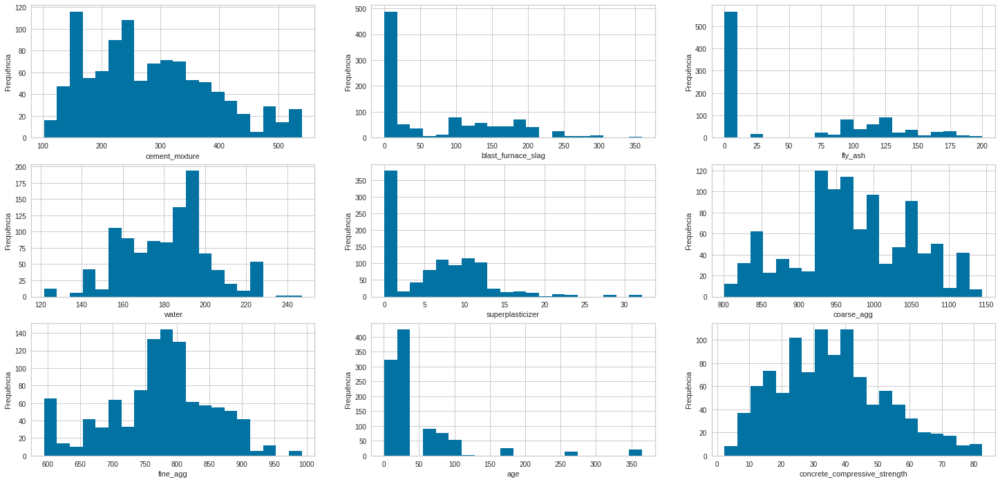

In [18]:
import numpy as np
import matplotlib.pyplot as plt

contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 3 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):

      ax.hist(df.select_dtypes(include='number')[contColNames[counter]], bins=20)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')

    else:
      ax.set_axis_off()

    counter += 1

plt.show()

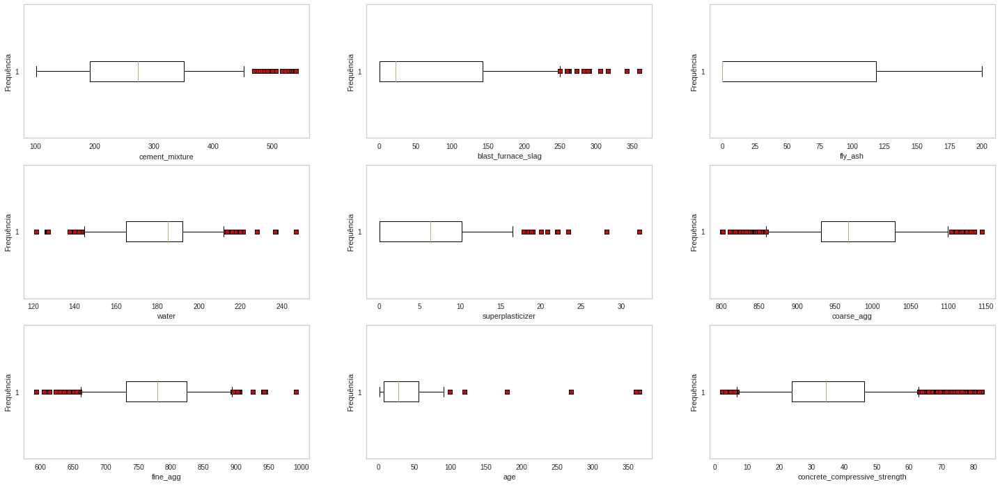

In [19]:
contColNames = list(df.select_dtypes(include='number').columns) #-> seleciona apenas colunas numéricas
ncols = 3 #-> número de colunas que armazenarão os plots na figure 
nrows = int(np.ceil(len(contColNames)/(1.0 * ncols))) #-> número de linhas que armazenarão os plots na figure

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(25,12))

counter = 0 

for i in range(nrows):
  for j in range(ncols):

    ax = axes[i][j]

    # Plotar somente quando houver dados
    if counter < len(contColNames):
      red_square = dict(markerfacecolor='r', marker='s')
      ax.boxplot(df.select_dtypes(include='number')[contColNames[counter]], flierprops=red_square, vert=False, whis=0.75)
      ax.set_xlabel(contColNames[counter])
      ax.set_ylabel('Frequência')
      ax.grid(False)
    else:
      ax.set_axis_off()

    counter += 1

plt.show()

### b) Correlação Numérica

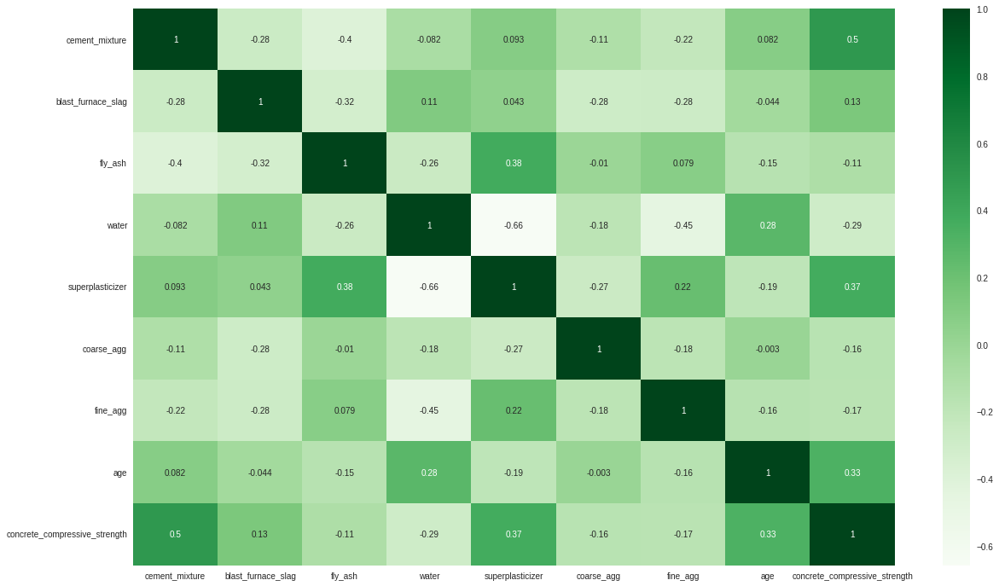

In [28]:
import seaborn as sns
plt.figure(figsize=(20,12))
sns.heatmap(df.corr(), annot=True, cmap='Greens')

## (iv) Separação: Features (X) e Target (y)

In [29]:
X = df.drop(['concrete_compressive_strength'], axis=1)
y = df.concrete_compressive_strength

print(X.head(),'\n\n',y.head())

   cement_mixture  blast_furnace_slag  fly_ash  ...  coarse_agg  fine_agg  age
0           540.0                 0.0      0.0  ...      1040.0     676.0   28
1           540.0                 0.0      0.0  ...      1055.0     676.0   28
2           332.5               142.5      0.0  ...       932.0     594.0  270
3           332.5               142.5      0.0  ...       932.0     594.0  365
4           198.6               132.4      0.0  ...       978.4     825.5  360

[5 rows x 8 columns] 

 0    79.986111
1    61.887366
2    40.269535
3    41.052780
4    44.296075
Name: concrete_compressive_strength, dtype: float64


## (v) Treinamento e validação dos modelos

> Split em Treino e Teste

In [30]:
from sklearn.model_selection import train_test_split

# Separar o conjunto de dados em Treino/Teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(772, 8)
(772,)
(258, 8)
(258,)


### a) Regressão Linear Comum

> Ajuste do modelo

In [31]:
model_linear = LinearRegression()
model_linear.fit(X_train, y_train)

LinearRegression()

In [67]:
print(list(X.columns))
print(model_linear.coef_)

['cement_mixture', 'blast_furnace_slag', 'fly_ash', 'water', 'superplasticizer', 'coarse_agg', 'fine_agg', 'age']
[ 0.12176452  0.1114873   0.08538774 -0.11444555  0.33645779  0.02377977
  0.02954124  0.11511269]


> Predição dos Valores

In [33]:
pred_linear= model_linear.predict(X_test)
pred_linear

array([59.09814972, 51.97287397, 63.38803826, 51.51242322, 17.12425941,
       39.47058812, 26.47585862, 44.76041298, 29.62140776, 37.93621564,
       27.83978705, 19.55636864, 66.79602103, 52.21276241, 29.94904772,
       44.22504198, 29.05589855, 26.45067517, 31.87365382, 32.08679944,
       36.76477792, 31.76439062, 38.18832782, 25.04123301, 32.9073356 ,
       34.07088759, 14.68421174, 40.12402021, 41.82894073, 21.28957603,
       35.79563213, 30.79922901, 43.52835009, 45.50523714, 30.83417828,
       29.33476833, 29.14773606, 38.51484284, 20.2900653 , 38.56543611,
       21.44701558, 15.88776001, 31.1036826 , 50.84142804, 20.64677451,
       57.50828847, 50.64410536, 60.43746498, 20.18159599, 19.2384151 ,
       40.20575081, 36.00538975, 29.6609641 , 33.41321235, 46.74607764,
       51.40731603, 28.00983014, 16.0189912 , 29.94841893, 18.44025825,
       38.29022675, 20.07110261, 31.8127052 , 55.45934107, 22.92519112,
       21.3144481 , 32.06825877, 16.74496787, 25.69658843, 25.84

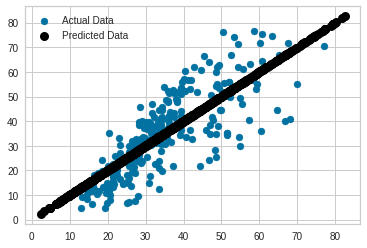

In [41]:
plt.scatter(pred_linear, y_test)
plt.scatter(y,y, color='black', lw=2)
plt.legend(('Actual Data', 'Predicted Data'))

> Métricas

In [35]:
print(mean_squared_error(y_test,pred_linear))
print(r2_score(y_test,pred_linear))

101.59690956892415
0.6249292900326935


> Distribuição de resíduos

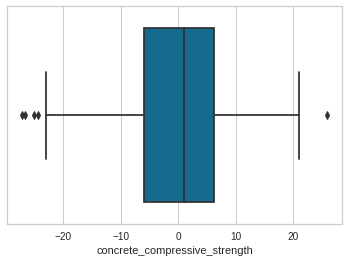

In [42]:
sns.boxplot(x=(y_test - pred_linear))

### b) Decision Tree Regressor

> Grid Search e Ajuste do Modelo

In [53]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

parameters = {'max_depth':range(1, 21), "criterion": ["mse", "mae"], 'random_state':range(0,51)}
reg = DecisionTreeRegressor()


grd = GridSearchCV(reg, parameters, scoring="neg_mean_absolute_error")
grd.fit(X_train, y_train)

GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': range(1, 21),
                         'random_state': range(0, 51)},
             scoring='neg_mean_absolute_error')

In [54]:
grd.cv_results_

{'mean_fit_time': array([0.00482068, 0.00467529, 0.00467424, ..., 0.0266726 , 0.02658749,
        0.02740765]),
 'mean_score_time': array([0.00294185, 0.00401769, 0.00359693, ..., 0.00213423, 0.00210452,
        0.00222616]),
 'mean_test_score': array([-11.54426578, -11.54426578, -11.54426578, ...,  -5.18971969,
         -5.1228873 ,  -5.144412  ]),
 'param_criterion': masked_array(data=['mse', 'mse', 'mse', ..., 'mae', 'mae', 'mae'],
              mask=[False, False, False, ..., False, False, False],
        fill_value='?',
             dtype=object),
 'param_max_depth': masked_array(data=[1, 1, 1, ..., 20, 20, 20],
              mask=[False, False, False, ..., False, False, False],
        fill_value='?',
             dtype=object),
 'param_random_state': masked_array(data=[0, 1, 2, ..., 48, 49, 50],
              mask=[False, False, False, ..., False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'criterion': 'mse', 'max_depth': 1, 'random_state': 0

In [55]:
grd.best_estimator_

DecisionTreeRegressor(criterion='mse', max_depth=15, random_state=39)

> Predição dos Valores

In [56]:
y_pred = grd.predict(X_test)
y_pred

array([51.73276323, 39.39665864, 71.29871316, 35.3011712 , 10.53588276,
       44.27814872, 23.69660064, 51.0556978 , 33.94290348, 38.89334116,
       44.38846488, 17.20035777, 40.59634688, 42.79577532, 17.8229546 ,
       25.42235907, 40.06200298, 17.23621052, 37.17103011, 31.81242264,
       38.80439876, 40.56876784, 45.08483564,  4.90355331, 34.67374804,
       35.86585204,  7.83934212, 49.89737812, 56.7438748 , 12.54156844,
       67.30664712, 32.72253096, 54.59891496, 51.0556978 , 20.72564856,
       36.44776979, 33.94290348, 44.27814872, 10.08979178, 51.25564584,
       17.54026944,  3.31982694, 41.71950328, 46.68441996, 12.39677848,
       61.09446836, 59.49488404, 38.70028788, 27.53077668,  9.69472204,
       57.21823429, 49.97322048, 24.3385028 , 17.20035777, 43.94237391,
       28.59946448, 26.31040416, 11.48391226, 38.56239268, 19.69143456,
       44.27814872, 15.61594192, 34.55653712, 56.09576736, 28.02168359,
       18.03393426, 32.39847724, 12.18097249, 31.53663224, 20.72

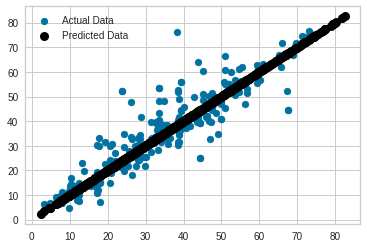

In [61]:
plt.scatter(grd.predict(X_test), y_test)
plt.scatter(y,y, color='black', lw=2)
plt.legend(('Actual Data', 'Predicted Data'))

> Métricas

In [57]:
from sklearn.metrics import mean_absolute_error

print(mean_absolute_error(y_train, grd.predict(X_train)))
mean_absolute_error(y_test, y_pred)

0.07285688468755437


4.5270547490456075

In [59]:
print(mean_squared_error(y_test,grd.predict(X_test)))
print(r2_score(y_test,grd.predict(X_test)))

52.23104016003565
0.8071758934570226


> Distribuição dos Resíduos

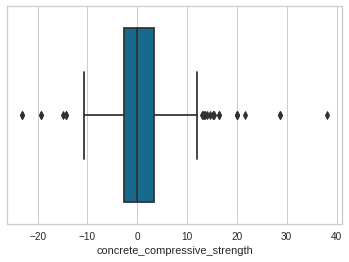

In [62]:
sns.boxplot(x=(y_test - grd.predict(X_test)))

Conclusão:

Fica evidente que o modelo por Decision Tree apresentou melhores métricas quando comparado ao de regressão linear simples (primeiro devido ao fato de ele ser um modelo mais robusto, segundo porque utilizamos o GridSearch para otimizar seus hiperparâmetros)